# Task 4 Cross Modal MusicCaps Alignment

Goal

Learn one shared embedding space for MusicCaps audio structure graphs and natural language captions.

The model supports caption to audio retrieval and audio to caption retrieval.

evaluates zero shot MusicCaps aspect prediction.






In [1]:
# ============================================================
# CELL 1 - INSTALL
# ============================================================
!pip -q install "datasets==3.6.0" torch-geometric transformers==4.46.3 librosa==0.10.2.post1 soundfile joblib networkx

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 491.5/491.5 kB 12.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 81.5 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 260.1/260.1 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.4/566.4 kB 30.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 82.1 MB/s eta 0:00:00:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tpot 1.1.0 requires dill>=0.3.9, but you have dill 0.3.8 which is incompatible.


In [2]:
# ============================================================
# CELL 2 - IMPORTS
# ============================================================
import os, sys, gc, io, ast, json, math, time, random, shutil, warnings
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import joblib

import librosa
import librosa.display
import soundfile as sf

from datasets import load_dataset, Audio

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    f1_score,
    average_precision_score,
    precision_recall_curve,
)
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch_geometric.data import Data
from torch_geometric.loader import DataLoader as GeoDataLoader
from torch_geometric.nn import SAGEConv, global_mean_pool

from transformers import AutoTokenizer, AutoModel

from IPython.display import display, Audio as IPyAudio, Markdown

warnings.filterwarnings("ignore")

print("Python:", sys.version.split()[0])
print("PyTorch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Python: 3.12.13
PyTorch: 2.10.0+cu128
CUDA: True
GPU: Tesla T4


In [3]:
# CELL 3  Reproducibility configuration and output folders

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

OFFICIAL_DATASET_ID = "google/MusicCaps"
AUDIO_DATASET_ID = "CLAPv2/MusicCaps"

SR = 22050
CLIP_SECONDS = 10.0

BEATS_PER_NODE = 2
MIN_NODES = 5
MAX_NODES = 20
FALLBACK_SEGMENT_SECONDS = 1.0
MIN_SEGMENT_SECONDS = 0.45

N_FFT = 2048
HOP = 512
N_MFCC = 20

SIM_THRESHOLD = 0.50
SIM_TOP_K = 3

TEXT_MODEL_NAME = "bert-base-uncased"
MAX_TEXT_LENGTH = 128
BERT_UNFREEZE_LAST_N = 2

GRAPH_HIDDEN = 192
EMBED_DIM = 256
DROPOUT = 0.20

INITIAL_TEMPERATURE = 0.07
LEARNABLE_TEMPERATURE = True

BATCH_SIZE = 32
EPOCHS = 20
PATIENCE = 4

LR_BERT = 2e-5
LR_NEW = 4e-4
WEIGHT_DECAY = 1e-4

AMP = (
    torch.cuda.is_available()
    and DEVICE.type == "cuda"
)

FAST_DEV_RUN = False
DEV_TRAIN = 600
DEV_VAL = 300
DEV_TEST = 300

ZERO_SHOT_MAX_TAGS = 40
ZERO_SHOT_MIN_TRAIN_COUNT = 12

KAGGLE_WORKING = Path(
    "/kaggle/working"
)

if not KAGGLE_WORKING.exists():
    KAGGLE_WORKING = Path(
        "./kaggle_working"
    )

    KAGGLE_WORKING.mkdir(
        parents=True,
        exist_ok=True,
    )

GITHUB_DIR = (
    KAGGLE_WORKING
    / "task4_musiccaps_github"
)

CACHE_DIR = (
    KAGGLE_WORKING
    / "task4_musiccaps_runtime_cache"
)

GRAPH_DIR = (
    CACHE_DIR
    / "raw_graphs"
)

METRICS_DIR = (
    GITHUB_DIR
    / "metrics"
)

PLOT_DIR = (
    GITHUB_DIR
    / "plots"
)

SPLIT_DIR = (
    GITHUB_DIR
    / "data_splits"
)

SAMPLE_DIR = (
    GITHUB_DIR
    / "graph_samples_24"
)

QUAL_DIR = (
    GITHUB_DIR
    / "retrieval_examples"
)

CONFIG_DIR = (
    GITHUB_DIR
    / "config"
)

PREPROCESSING_DIR = (
    GITHUB_DIR
    / "preprocessing"
)

for folder in [
    GITHUB_DIR,
    CACHE_DIR,
    GRAPH_DIR,
    METRICS_DIR,
    PLOT_DIR,
    SPLIT_DIR,
    SAMPLE_DIR,
    QUAL_DIR,
    CONFIG_DIR,
    PREPROCESSING_DIR,
]:
    folder.mkdir(
        parents=True,
        exist_ok=True,
    )

# Compatibility alias for result writing cells.
RESULT_DIR = METRICS_DIR

print("Device:", DEVICE)
print("GitHub output folder:", GITHUB_DIR)
print("Runtime graph cache:", GRAPH_DIR)
print("Model weights will not be saved.")

Device: cuda
GitHub output folder: /kaggle/working/task4_musiccaps_github
Runtime graph cache: /kaggle/working/task4_musiccaps_runtime_cache/raw_graphs
Model weights will not be saved.


# Load MusicCaps

The official Google MusicCaps dataset is loaded for metadata provenance.

An audio enabled Hugging Face mirror is used for waveform access.

The mirror can contain fewer clips than the original dataset because some source audio is no longer available.

In [4]:
# ============================================================
# CELL 4 - LOAD OFFICIAL MUSICCAPS METADATA
# ============================================================
official_ds = load_dataset(
    OFFICIAL_DATASET_ID,
    split="train"
)

print("Official google/MusicCaps rows:", len(official_ds))
print("Official columns:")
print(official_ds.column_names)

display(
    pd.DataFrame(
        official_ds[:3]
    )
)

README.md: 0.00B [00:00, ?B/s]

musiccaps-public.csv:   0%|          | 0.00/2.94M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5521 [00:00<?, ? examples/s]

Official google/MusicCaps rows: 5521
Official columns:
['ytid', 'start_s', 'end_s', 'audioset_positive_labels', 'aspect_list', 'caption', 'author_id', 'is_balanced_subset', 'is_audioset_eval']


,ytid,start_s,end_s,audioset_positive_labels,aspect_list,caption,author_id,is_balanced_subset,is_audioset_eval
0,-0Gj8-vB1q4,30,40,"/m/0140xf,/m/02cjck,/m/04rlf","['low quality', 'sustained strings melody', 's...",The low quality recording features a ballad so...,4,False,True
1,-0SdAVK79lg,30,40,"/m/0155w,/m/01lyv,/m/0342h,/m/042v_gx,/m/04rlf...","['guitar song', 'piano backing', 'simple percu...",This song features an electric guitar as the m...,0,False,False
2,-0vPFx-wRRI,30,40,"/m/025_jnm,/m/04rlf","['amateur recording', 'finger snipping', 'male...",a male voice is singing a melody with changing...,6,False,True


In [5]:
# CELL 5  Load the audio enabled MusicCaps mirror

audio_ds_raw = load_dataset(
    AUDIO_DATASET_ID,
    split="train",
)

print(
    "Audio mirror rows:",
    len(audio_ds_raw),
)

print(
    "Columns:"
)

print(
    audio_ds_raw.column_names
)

assert (
    "audio"
    in audio_ds_raw.column_names
), (
    f"{AUDIO_DATASET_ID} did not expose an audio column."
)

metadata_ds = (
    audio_ds_raw
    .remove_columns(
        ["audio"]
    )
)

audio_ds = (
    audio_ds_raw
    .cast_column(
        "audio",
        Audio(
            sampling_rate=SR
        )
    )
)

print(
    "Loaded MusicCaps audio available subset."
)

musiccaps_part_0.parquet:   0%|          | 0.00/927M [00:00<?, ?B/s]

musiccaps_part_1.parquet:   0%|          | 0.00/936M [00:00<?, ?B/s]

musiccaps_part_10.parquet:   0%|          | 0.00/628M [00:00<?, ?B/s]

musiccaps_part_2.parquet:   0%|          | 0.00/929M [00:00<?, ?B/s]

musiccaps_part_3.parquet:   0%|          | 0.00/930M [00:00<?, ?B/s]

musiccaps_part_4.parquet:   0%|          | 0.00/929M [00:00<?, ?B/s]

musiccaps_part_5.parquet:   0%|          | 0.00/932M [00:00<?, ?B/s]

musiccaps_part_6.parquet:   0%|          | 0.00/912M [00:00<?, ?B/s]

musiccaps_part_7.parquet:   0%|          | 0.00/918M [00:00<?, ?B/s]

musiccaps_part_8.parquet:   0%|          | 0.00/899M [00:00<?, ?B/s]

musiccaps_part_9.parquet:   0%|          | 0.00/894M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/5352 [00:00<?, ? examples/s]

Loading dataset shards:   0%|          | 0/18 [00:00<?, ?it/s]

Audio mirror rows: 5352
Columns:
['index', 'datasetname', 'audio', 'audio_len', 'start_s', 'end_s', 'audioset_positive_labels', 'aspect_list', 'caption', 'author_id', 'is_balanced_subset', 'is_audioset_eval']
Loaded MusicCaps audio available subset.


# Audio source note

The official Google MusicCaps dataset provides metadata and timestamps, not bundled waveform audio.

If the audio mirror is unavailable, use the official YouTube identifiers and timestamps to obtain the clips.

Do not replace missing clips with unrelated audio.

In [6]:
# ============================================================
# CELL 6 - ROBUST BOOLEAN / ASPECT PARSING
# ============================================================
def parse_bool(x):
    if isinstance(
        x,
        (bool, np.bool_)
    ):
        return bool(x)

    s = str(x).strip().lower()

    return s in {
        "true", "1", "yes", "y"
    }


def parse_aspect_list(x):
    if isinstance(x, list):
        return [
            str(v).strip()
            for v in x
            if str(v).strip()
        ]

    if x is None:
        return []

    text = str(x).strip()

    try:
        value = ast.literal_eval(
            text
        )

        if isinstance(value, list):
            return [
                str(v).strip()
                for v in value
                if str(v).strip()
            ]

    except Exception:
        pass

    # Conservative fallback.
    return [
        v.strip()
        for v in text.split(",")
        if v.strip()
    ]

In [7]:
# ============================================================
# CELL 7 - BUILD MIRROR METADATA FRAME
# ============================================================
rows = []

for i in range(
    len(metadata_ds)
):
    item = metadata_ds[i]

    pair_id = str(
        item.get(
            "index",
            f"row_{i:05d}"
        )
    )

    rows.append({
        "hf_index":
            i,

        "pair_id":
            pair_id,

        "caption":
            str(
                item.get(
                    "caption",
                    ""
                )
            ),

        "aspect_list":
            parse_aspect_list(
                item.get(
                    "aspect_list",
                    []
                )
            ),

        "is_balanced_subset":
            parse_bool(
                item.get(
                    "is_balanced_subset",
                    False
                )
            ),

        "is_audioset_eval":
            parse_bool(
                item.get(
                    "is_audioset_eval",
                    False
                )
            ),

        "author_id":
            item.get(
                "author_id",
                None
            ),
    })

meta = pd.DataFrame(
    rows
)

# Pair IDs must be unique for diagonal retrieval supervision.
dupes = meta[
    "pair_id"
].duplicated(
    keep=False
)

print(
    "Duplicate pair IDs:",
    int(
        dupes.sum()
    )
)

if dupes.any():
    display(
        meta[
            dupes
        ].head(20)
    )

    # Keep one paired caption/audio example per pair ID.
    meta = (
        meta
        .drop_duplicates(
            "pair_id",
            keep="first"
        )
        .reset_index(
            drop=True
        )
    )

print("Usable unique audio-caption pairs:", len(meta))
display(meta.head())

Duplicate pair IDs: 0
Usable unique audio-caption pairs: 5352


,hf_index,pair_id,caption,aspect_list,is_balanced_subset,is_audioset_eval,author_id
0,0,-0Gj8-vB1q4.wav,The low quality recording features a ballad so...,"[low quality, sustained strings melody, soft f...",False,True,4
1,1,-0SdAVK79lg.wav,This song features an electric guitar as the m...,"[guitar song, piano backing, simple percussion...",False,False,0
2,2,-0vPFx-wRRI.wav,a male voice is singing a melody with changing...,"[amateur recording, finger snipping, male mid ...",False,True,6
3,3,-0xzrMun0Rs.wav,This song contains digital drums playing a sim...,"[backing track, jazzy, digital drums, piano, e...",False,True,6
4,4,-1LrH01Ei1w.wav,This song features a rubber instrument being p...,"[rubab instrument, repetitive melody on differ...",False,False,0


# Create the MusicCaps split

Training uses AudioSet training source examples.

Validation uses AudioSet evaluation examples that are not in the balanced subset.

Test uses the MusicCaps balanced subset.

Only audio available pairs are used, so the exact counts can be slightly smaller than the original metadata counts.

In [8]:
# ============================================================
# CELL 8 - CREATE SPLITS
# ============================================================
def assign_split(row):
    if bool(
        row["is_balanced_subset"]
    ):
        return "test"

    if bool(
        row["is_audioset_eval"]
    ):
        return "validation"

    return "training"


meta["split"] = meta.apply(
    assign_split,
    axis=1
)

print(
    meta["split"]
    .value_counts()
)

print(
    "\nBalanced test rows:",
    int(
        meta[
            "is_balanced_subset"
        ].sum()
    )
)

assert (
    meta.loc[
        meta["split"] == "test",
        "is_balanced_subset"
    ].all()
), "Test split must be the balanced subset."

dataset_summary = {
    "official_musiccaps_rows": int(
        len(official_ds)
    ),
    "audio_available_unique_pairs": int(
        len(meta)
    ),
    "training_pairs": int(
        (
            meta["split"]
            == "training"
        ).sum()
    ),
    "validation_pairs": int(
        (
            meta["split"]
            == "validation"
        ).sum()
    ),
    "test_pairs": int(
        (
            meta["split"]
            == "test"
        ).sum()
    ),
}

with open(
    METRICS_DIR
    / "dataset_summary.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        dataset_summary,
        file,
        indent=2,
    )


split
training      2580
validation    1803
test           969
Name: count, dtype: int64

Balanced test rows: 969


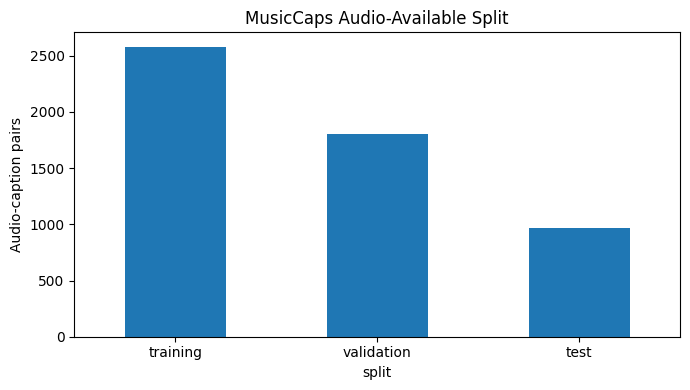

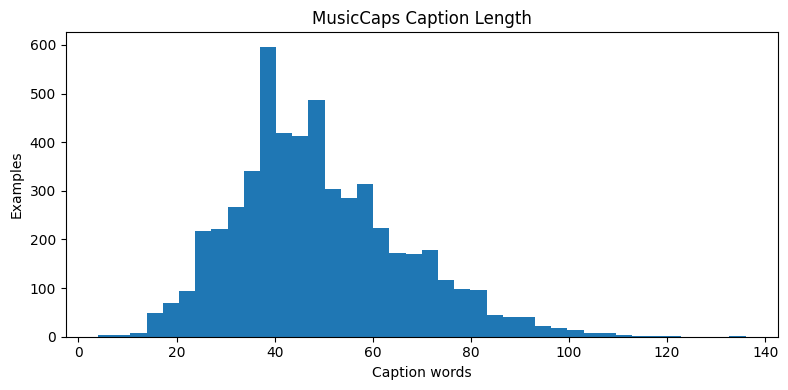

count    5352.000000
mean       48.960389
std        17.315013
min         4.000000
25%        37.000000
50%        46.000000
75%        60.000000
max       136.000000
Name: caption, dtype: float64

In [9]:
# ============================================================
# CELL 9 - SPLIT EDA
# ============================================================
split_counts = (
    meta["split"]
    .value_counts()
    .reindex(
        [
            "training",
            "validation",
            "test",
        ]
    )
)

plt.figure(
    figsize=(7, 4)
)

split_counts.plot(
    kind="bar"
)

plt.ylabel(
    "Audio-caption pairs"
)

plt.title(
    "MusicCaps Audio-Available Split"
)

plt.xticks(
    rotation=0
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "musiccaps_split_counts.png",
    dpi=180
)

plt.show()


caption_lengths = (
    meta["caption"]
    .str.split()
    .map(len)
)

plt.figure(
    figsize=(8, 4)
)

plt.hist(
    caption_lengths,
    bins=40
)

plt.xlabel(
    "Caption words"
)

plt.ylabel(
    "Examples"
)

plt.title(
    "MusicCaps Caption Length"
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "caption_length_distribution.png",
    dpi=180
)

plt.show()

display(
    caption_lengths.describe()
)

In [10]:
# ============================================================
# CELL 10 - DEBUG OR FULL DATASET
# ============================================================
if FAST_DEV_RUN:
    parts = []

    for split, n in [
        ("training", DEV_TRAIN),
        ("validation", DEV_VAL),
        ("test", DEV_TEST),
    ]:
        frame = meta[
            meta["split"]
            == split
        ]

        parts.append(
            frame.sample(
                n=min(
                    n,
                    len(frame)
                ),
                random_state=SEED
            )
        )

    exp_meta = (
        pd.concat(parts)
        .reset_index(drop=True)
    )

else:
    exp_meta = (
        meta.copy()
        .reset_index(drop=True)
    )


print(
    "Experiment rows:",
    len(exp_meta)
)

display(
    exp_meta[
        "split"
    ].value_counts()
)

Experiment rows: 5352


split
training      2580
validation    1803
test           969
Name: count, dtype: int64

# Decode MusicCaps audio

The helper supports different Hugging Face audio object formats.

Every clip is converted to mono audio at 22,050 samples per second and padded or trimmed to 10 seconds.

In [11]:
# ============================================================
# CELL 11 - DECODE HUGGING FACE AUDIO
# ============================================================
def decode_audio_item(
    item,
    target_sr=SR,
    target_seconds=CLIP_SECONDS
):
    audio = item["audio"]

    y = None
    sr = None

    # datasets<=3.x typical dictionary.
    if isinstance(
        audio,
        dict
    ):
        if (
            "array" in audio
            and audio["array"] is not None
        ):
            y = np.asarray(
                audio["array"],
                dtype=np.float32
            )

            sr = int(
                audio.get(
                    "sampling_rate",
                    target_sr
                )
            )

        elif (
            "bytes" in audio
            and audio["bytes"] is not None
        ):
            y, sr = sf.read(
                io.BytesIO(
                    audio["bytes"]
                ),
                always_2d=False
            )

        elif (
            "path" in audio
            and audio["path"]
        ):
            y, sr = sf.read(
                audio["path"],
                always_2d=False
            )

    # Newer torchcodec-based object.
    elif hasattr(
        audio,
        "get_all_samples"
    ):
        samples = (
            audio.get_all_samples()
        )

        data = samples.data

        if torch.is_tensor(
            data
        ):
            data = (
                data
                .detach()
                .cpu()
                .numpy()
            )

        y = np.asarray(
            data,
            dtype=np.float32
        )

        sr = int(
            samples.sample_rate
        )

    if y is None:
        raise RuntimeError(
            "Could not decode Hugging Face audio object."
        )

    y = np.asarray(
        y,
        dtype=np.float32
    )

    if y.ndim > 1:
        # Handle [channels, samples] or [samples, channels].
        if y.shape[0] <= 8:
            y = y.mean(
                axis=0
            )
        else:
            y = y.mean(
                axis=1
            )

    if sr != target_sr:
        y = librosa.resample(
            y,
            orig_sr=sr,
            target_sr=target_sr
        )

    target_len = int(
        target_sr
        * target_seconds
    )

    if len(y) < target_len:
        y = np.pad(
            y,
            (
                0,
                target_len - len(y)
            )
        )

    else:
        y = y[
            :target_len
        ]

    if not np.isfinite(
        y
    ).all():
        raise ValueError(
            "Audio contains NaN/Inf."
        )

    return y.astype(
        np.float32
    )

In [12]:
# ============================================================
# CELL 12 - AUDIO SMOKE TEST
# ============================================================
smoke_row = exp_meta.iloc[0]

smoke_item = audio_ds[
    int(
        smoke_row["hf_index"]
    )
]

smoke_audio = decode_audio_item(
    smoke_item
)

print(
    "Caption:",
    smoke_row["caption"][:500]
)

print(
    "Audio shape:",
    smoke_audio.shape
)

print(
    "Duration:",
    len(smoke_audio) / SR
)

display(
    IPyAudio(
        smoke_audio,
        rate=SR
    )
)

Caption: The low quality recording features a ballad song that contains sustained strings, mellow piano melody and soft female vocal singing over it. It sounds sad and soulful, like something you would hear at Sunday services.
Audio shape: (220500,)
Duration: 10.0


# Build MusicCaps audio graphs

Each 10 second clip is divided into groups of two beats.

Fixed one second segments are used only when beat segmentation is unsuitable.

Each graph node contains 100 audio features built from MFCC, chroma, spectral contrast, tonnetz, and spectral statistics.

Every graph contains temporal edges and non local cosine similarity edges.

In [13]:
# ============================================================
# CELL 13 - FRAME DESCRIPTORS
# ============================================================
def frame_descriptors(
    y
):
    stft = np.abs(
        librosa.stft(
            y,
            n_fft=N_FFT,
            hop_length=HOP
        )
    )

    power = (
        stft ** 2
    )

    mel = (
        librosa.feature
        .melspectrogram(
            S=power,
            sr=SR,
            n_mels=64,
            n_fft=N_FFT,
            hop_length=HOP
        )
    )

    logmel = (
        librosa.power_to_db(
            mel,
            ref=1.0
        )
    )

    mfcc = (
        librosa.feature
        .mfcc(
            S=logmel,
            n_mfcc=N_MFCC
        )
    )

    chroma = (
        librosa.feature
        .chroma_stft(
            S=power,
            sr=SR,
            n_chroma=12
        )
    )

    contrast = (
        librosa.feature
        .spectral_contrast(
            S=stft,
            sr=SR,
            n_bands=6
        )
    )

    tonnetz = (
        librosa.feature
        .tonnetz(
            chroma=chroma,
            sr=SR
        )
    )

    centroid = (
        librosa.feature
        .spectral_centroid(
            S=stft,
            sr=SR
        )
    )

    bandwidth = (
        librosa.feature
        .spectral_bandwidth(
            S=stft,
            sr=SR
        )
    )

    rolloff = (
        librosa.feature
        .spectral_rolloff(
            S=stft,
            sr=SR
        )
    )

    zcr = (
        librosa.feature
        .zero_crossing_rate(
            y,
            frame_length=N_FFT,
            hop_length=HOP
        )
    )

    rms = (
        librosa.feature
        .rms(
            S=stft,
            frame_length=N_FFT,
            hop_length=HOP
        )
    )

    arrays = [
        mfcc,
        chroma,
        contrast,
        tonnetz,
        centroid,
        bandwidth,
        rolloff,
        zcr,
        rms,
    ]

    T = min(
        a.shape[1]
        for a in arrays
    )

    arrays = [
        a[:, :T]
        for a in arrays
    ]

    full = np.vstack(
        arrays
    ).astype(
        np.float32
    )

    sim = np.vstack([
        mfcc[:13, :T],
        chroma[:, :T],
        contrast[:, :T],
    ]).astype(
        np.float32
    )

    assert (
        full.shape[0]
        == 50
    )

    assert (
        sim.shape[0]
        == 32
    )

    return full, sim

In [14]:
# ============================================================
# CELL 14 - BEAT-SYNCHRONOUS BOUNDARIES
# ============================================================
def fixed_boundaries():
    values = list(
        np.arange(
            0,
            CLIP_SECONDS,
            FALLBACK_SEGMENT_SECONDS
        )
    ) + [
        CLIP_SECONDS
    ]

    return (
        np.asarray(
            sorted(
                set(
                    map(
                        float,
                        values
                    )
                )
            ),
            dtype=np.float32
        ),
        "fixed_1s"
    )


def musical_boundaries(
    y
):
    try:
        _, beat_frames = (
            librosa.beat
            .beat_track(
                y=y,
                sr=SR,
                hop_length=HOP
            )
        )

        beat_frames = (
            np.asarray(
                beat_frames
            )
            .reshape(-1)
        )

        if len(
            beat_frames
        ) < 6:
            return fixed_boundaries()

        beat_times = (
            librosa.frames_to_time(
                beat_frames,
                sr=SR,
                hop_length=HOP
            )
        )

        raw = (
            [0.0]
            +
            list(
                beat_times[
                    ::BEATS_PER_NODE
                ]
            )
            +
            [CLIP_SECONDS]
        )

        raw = np.asarray(
            sorted(
                set(
                    float(
                        np.clip(
                            x,
                            0,
                            CLIP_SECONDS
                        )
                    )
                    for x in raw
                )
            ),
            dtype=np.float32
        )

        kept = [
            float(
                raw[0]
            )
        ]

        for x in raw[
            1:-1
        ]:
            if (
                float(x)
                - kept[-1]
                >= MIN_SEGMENT_SECONDS
            ):
                kept.append(
                    float(x)
                )

        if (
            CLIP_SECONDS
            - kept[-1]
            < MIN_SEGMENT_SECONDS
            and len(kept) > 1
        ):
            kept[-1] = (
                CLIP_SECONDS
            )

        else:
            kept.append(
                CLIP_SECONDS
            )

        boundaries = (
            np.asarray(
                sorted(
                    set(
                        kept
                    )
                ),
                dtype=np.float32
            )
        )

        n_nodes = (
            len(
                boundaries
            )
            - 1
        )

        if (
            n_nodes < MIN_NODES
            or
            n_nodes > MAX_NODES
        ):
            return fixed_boundaries()

        return (
            boundaries,
            "beat_2"
        )

    except Exception:
        return fixed_boundaries()

In [15]:
# ============================================================
# CELL 15 - AUDIO -> GRAPH NODE FEATURES
# ============================================================
def l2norm(
    v
):
    return (
        v
        /
        (
            np.linalg.norm(
                v
            )
            + 1e-8
        )
    )


def audio_to_nodes(
    y
):
    full, sim = (
        frame_descriptors(
            y
        )
    )

    boundaries, mode = (
        musical_boundaries(
            y
        )
    )

    node_features = []
    similarity_features = []

    for (
        start_sec,
        end_sec
    ) in zip(
        boundaries[:-1],
        boundaries[1:]
    ):
        a = int(
            librosa.time_to_frames(
                start_sec,
                sr=SR,
                hop_length=HOP
            )
        )

        b = int(
            librosa.time_to_frames(
                end_sec,
                sr=SR,
                hop_length=HOP
            )
        )

        a = max(
            0,
            min(
                a,
                full.shape[1] - 1
            )
        )

        b = max(
            a + 1,
            min(
                b,
                full.shape[1]
            )
        )

        f = full[
            :,
            a:b
        ]

        node = np.concatenate([
            f.mean(
                axis=1
            ),
            f.std(
                axis=1
            )
        ]).astype(
            np.float32
        )

        s = sim[
            :,
            a:b
        ].mean(
            axis=1
        )

        # Descriptor-block normalization.
        mfcc_s = l2norm(
            s[:13]
        )

        chroma_s = l2norm(
            s[13:25]
        )

        contrast_s = l2norm(
            s[25:32]
        )

        struct = l2norm(
            np.concatenate([
                mfcc_s,
                chroma_s,
                contrast_s
            ])
        ).astype(
            np.float32
        )

        node_features.append(
            node
        )

        similarity_features.append(
            struct
        )

    X = np.stack(
        node_features
    ).astype(
        np.float32
    )

    S = np.stack(
        similarity_features
    ).astype(
        np.float32
    )

    assert (
        X.shape[1]
        == 100
    )

    return (
        X,
        S,
        boundaries,
        mode
    )

In [16]:
# ============================================================
# CELL 16 - GRAPH EDGES
# ============================================================
def build_edges(
    S
):
    n = len(
        S
    )

    edges = {}

    # Temporal backbone.
    for i in range(
        n - 1
    ):
        edges[
            (i, i + 1)
        ] = (
            0,
            1.0
        )

        edges[
            (i + 1, i)
        ] = (
            0,
            1.0
        )

    cosine = (
        S @ S.T
    )

    np.fill_diagonal(
        cosine,
        -np.inf
    )

    # Non-local similarity links.
    for i in range(n):
        order = np.argsort(
            cosine[i]
        )[::-1]

        added = 0

        for j in order:
            j = int(j)

            if abs(
                i - j
            ) <= 1:
                continue

            score = float(
                cosine[
                    i,
                    j
                ]
            )

            if (
                score
                < SIM_THRESHOLD
            ):
                break

            if (
                i,
                j
            ) not in edges:
                edges[
                    (i, j)
                ] = (
                    1,
                    score
                )

            if (
                j,
                i
            ) not in edges:
                edges[
                    (j, i)
                ] = (
                    1,
                    score
                )

            added += 1

            if (
                added
                >= SIM_TOP_K
            ):
                break

    pairs = sorted(
        edges
    )

    edge_index = torch.tensor(
        pairs,
        dtype=torch.long
    ).t().contiguous()

    edge_type = torch.tensor(
        [
            edges[p][0]
            for p in pairs
        ],
        dtype=torch.long
    )

    edge_weight = torch.tensor(
        [
            edges[p][1]
            for p in pairs
        ],
        dtype=torch.float32
    )

    return (
        edge_index,
        edge_type,
        edge_weight,
        cosine
    )

In [17]:
# ============================================================
# CELL 17 - HF ROW -> RAW GRAPH
# ============================================================
def build_raw_graph(
    meta_row
):
    hf_idx = int(
        meta_row[
            "hf_index"
        ]
    )

    item = audio_ds[
        hf_idx
    ]

    y = decode_audio_item(
        item
    )

    X, S, boundaries, mode = (
        audio_to_nodes(
            y
        )
    )

    (
        edge_index,
        edge_type,
        edge_weight,
        similarity
    ) = build_edges(
        S
    )

    graph = Data(
        x=torch.tensor(
            X,
            dtype=torch.float32
        ),

        edge_index=
            edge_index,

        edge_type=
            edge_type,

        edge_weight=
            edge_weight,

        pair_index=torch.tensor(
            [
                int(
                    meta_row.name
                )
            ],
            dtype=torch.long
        ),
    )

    graph.boundaries = (
        torch.tensor(
            boundaries,
            dtype=torch.float32
        )
    )

    graph.segmentation_mode = (
        mode
    )

    return (
        graph,
        y,
        similarity
    )

Data(x=[9, 100], edge_index=[2, 52], edge_type=[52], edge_weight=[52], pair_index=[1], boundaries=[10], segmentation_mode='beat_2')
nodes: 9
node dim: 100
temporal edges: 16
similarity edges: 36
segmentation: beat_2


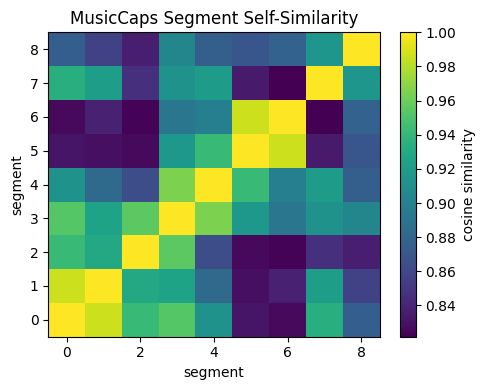

In [18]:
# ============================================================
# CELL 18 - GRAPH SMOKE TEST
# ============================================================
smoke_meta = (
    exp_meta
    .iloc[0]
)

smoke_graph, _, smoke_similarity = (
    build_raw_graph(
        smoke_meta
    )
)

print(
    smoke_graph
)

print(
    "nodes:",
    smoke_graph.num_nodes
)

print(
    "node dim:",
    smoke_graph.num_node_features
)

print(
    "temporal edges:",
    int(
        (
            smoke_graph.edge_type
            == 0
        ).sum()
    )
)

print(
    "similarity edges:",
    int(
        (
            smoke_graph.edge_type
            == 1
        ).sum()
    )
)

print(
    "segmentation:",
    smoke_graph.segmentation_mode
)


plt.figure(
    figsize=(5, 4)
)

ssm = (
    smoke_similarity.copy()
)

np.fill_diagonal(
    ssm,
    1.0
)

plt.imshow(
    ssm,
    origin="lower",
    aspect="auto"
)

plt.colorbar(
    label="cosine similarity"
)

plt.title(
    "MusicCaps Segment Self-Similarity"
)

plt.xlabel(
    "segment"
)

plt.ylabel(
    "segment"
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "example_self_similarity.png",
    dpi=180
)

plt.show()

# Precompute graph cache

The complete raw graph cache is stored outside the GitHub download folder because it can be regenerated and is too large for GitHub.

Only 24 representative graph examples are copied into the final downloadable folder.

In [19]:
# ============================================================
# CELL 19 - CACHE RAW GRAPHS
# ============================================================
graph_failures = []

start = time.time()

for k, row in (
    exp_meta.iterrows()
):
    pair_id = str(
        row["pair_id"]
    )

    safe_name = (
        f"{int(row['hf_index']):05d}"
    )

    out = (
        GRAPH_DIR
        / f"{safe_name}.pt"
    )

    if out.exists():
        continue

    try:
        graph, _, _ = (
            build_raw_graph(
                row
            )
        )

        # Store the HF index rather than arbitrary dataframe index.
        graph.hf_index = torch.tensor(
            [
                int(
                    row["hf_index"]
                )
            ],
            dtype=torch.long
        )

        torch.save(
            graph,
            out
        )

    except Exception as e:
        graph_failures.append({
            "hf_index":
                int(
                    row["hf_index"]
                ),

            "pair_id":
                pair_id,

            "error":
                repr(e),
        })

    if (
        k + 1
    ) % 200 == 0:
        print(
            f"{k+1}/{len(exp_meta)} | "
            f"cached={len(list(GRAPH_DIR.glob('*.pt')))} | "
            f"failures={len(graph_failures)} | "
            f"elapsed={(time.time()-start)/60:.1f} min"
        )


failure_df = pd.DataFrame(
    graph_failures,
    columns=[
        "hf_index",
        "pair_id",
        "error"
    ]
)

failure_df.to_csv(
    RESULT_DIR
    / "graph_build_failures.csv",
    index=False
)

print(
    "Cached graphs:",
    len(
        list(
            GRAPH_DIR.glob(
                "*.pt"
            )
        )
    )
)

print(
    "Graph failures:",
    len(
        failure_df
    )
)

200/5352 | cached=200 | failures=0 | elapsed=0.4 min
400/5352 | cached=400 | failures=0 | elapsed=0.8 min
600/5352 | cached=600 | failures=0 | elapsed=1.2 min
800/5352 | cached=800 | failures=0 | elapsed=1.6 min
1000/5352 | cached=1000 | failures=0 | elapsed=1.9 min
1200/5352 | cached=1200 | failures=0 | elapsed=2.3 min
1400/5352 | cached=1400 | failures=0 | elapsed=2.7 min
1600/5352 | cached=1600 | failures=0 | elapsed=3.1 min
1800/5352 | cached=1800 | failures=0 | elapsed=3.5 min
2000/5352 | cached=2000 | failures=0 | elapsed=3.9 min
2200/5352 | cached=2200 | failures=0 | elapsed=4.2 min
2400/5352 | cached=2400 | failures=0 | elapsed=4.6 min
2600/5352 | cached=2600 | failures=0 | elapsed=5.0 min
2800/5352 | cached=2800 | failures=0 | elapsed=5.4 min
3000/5352 | cached=3000 | failures=0 | elapsed=5.8 min
3200/5352 | cached=3200 | failures=0 | elapsed=6.2 min
3400/5352 | cached=3400 | failures=0 | elapsed=6.5 min
3600/5352 | cached=3600 | failures=0 | elapsed=6.9 min
3800/5352 | cached

In [23]:
# ============================================================
# CELL 20 - GRAPH INTEGRITY / DENSITY AUDIT
# ============================================================
audit = []
bad_graphs = []

for p in sorted(
    GRAPH_DIR.glob(
        "*.pt"
    )
):
    try:
        g = torch.load(
            p,
            weights_only=False
        )

        problems = []

        if (
            g.x.ndim != 2
            or
            g.x.shape[1] != 100
        ):
            problems.append(
                f"x_shape={tuple(g.x.shape)}"
            )

        if not torch.isfinite(
            g.x
        ).all():
            problems.append(
                "nonfinite_x"
            )

        if (
            g.edge_index.ndim != 2
            or
            g.edge_index.shape[0] != 2
        ):
            problems.append(
                "bad_edge_index"
            )

        temporal = int(
            (
                g.edge_type
                == 0
            ).sum()
        )

        similarity = int(
            (
                g.edge_type
                == 1
            ).sum()
        )

        audit.append({
            "hf_index":
                int(
                    g.hf_index.item()
                ),

            "nodes":
                g.num_nodes,

            "edges":
                g.num_edges,

            "temporal_edges":
                temporal,

            "similarity_edges":
                similarity,

            "similarity_edges_per_node":
                similarity
                / max(
                    g.num_nodes,
                    1
                ),

            "segmentation_mode":
                getattr(
                    g,
                    "segmentation_mode",
                    "unknown"
                )
        })

        if problems:
            bad_graphs.append({
                "file":
                    p.name,

                "problem":
                    "; ".join(
                        problems
                    )
            })

    except Exception as e:
        bad_graphs.append({
            "file":
                p.name,

            "problem":
                repr(e)
        })


audit_df = pd.DataFrame(
    audit
)

bad_df = pd.DataFrame(
    bad_graphs,
    columns=[
        "file",
        "problem"
    ]
)

audit_df.to_csv(
    RESULT_DIR
    / "graph_audit.csv",
    index=False
)

bad_df.to_csv(
    RESULT_DIR
    / "bad_graphs.csv",
    index=False
)

display(
    audit_df.select_dtypes(include=[np.number]).describe()
    )


print(
    "\nSegmentation:"
)

display(
    audit_df[
        "segmentation_mode"
    ].value_counts()
)

print(
    "Bad graphs:",
    len(
        bad_df
    )
)

mean_sim_density = float(
    audit_df[
        "similarity_edges_per_node"
    ].mean()
)

print(
    "Mean similarity edges/node:",
    round(
        mean_sim_density,
        3
    )
)

if (
    mean_sim_density
    < 1.0
):
    print(
        "WARNING: graph is similarity-sparse. "
        "Consider SIM_THRESHOLD=0.40 before the final run."
    )

else:
    print(
        "PASS: non-local similarity structure is present."
    )

,hf_index,nodes,edges,temporal_edges,similarity_edges,similarity_edges_per_node
count,5352.000000,5352.000000,5352.000000,5352.000000,5352.000000,5352.000000
mean,2675.500000,9.814649,56.727952,17.629297,39.098655,3.925307
std,1545.133651,2.354181,16.162577,4.708361,11.560602,0.416022
min,0.000000,5.000000,20.000000,8.000000,12.000000,2.000000
25%,1337.750000,8.000000,46.000000,14.000000,32.000000,3.750000
50%,2675.500000,10.000000,58.000000,18.000000,40.000000,4.000000
75%,4013.250000,11.000000,66.000000,20.000000,46.000000,4.200000
max,5351.000000,19.000000,120.000000,36.000000,84.000000,4.933333



Segmentation:


segmentation_mode
beat_2      5154
fixed_1s     198
Name: count, dtype: int64

Bad graphs: 0
Mean similarity edges/node: 3.925
PASS: non-local similarity structure is present.


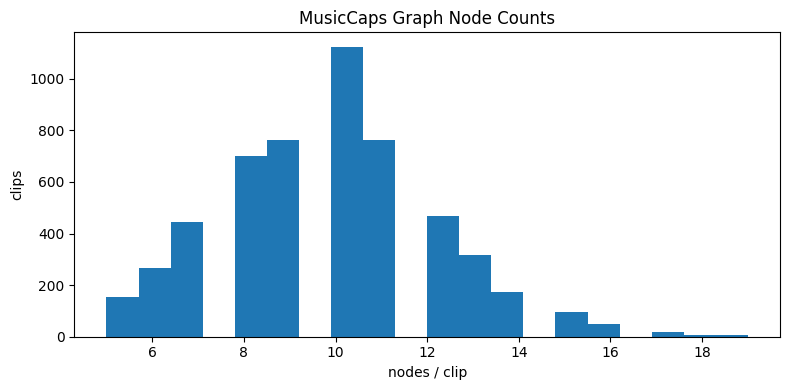

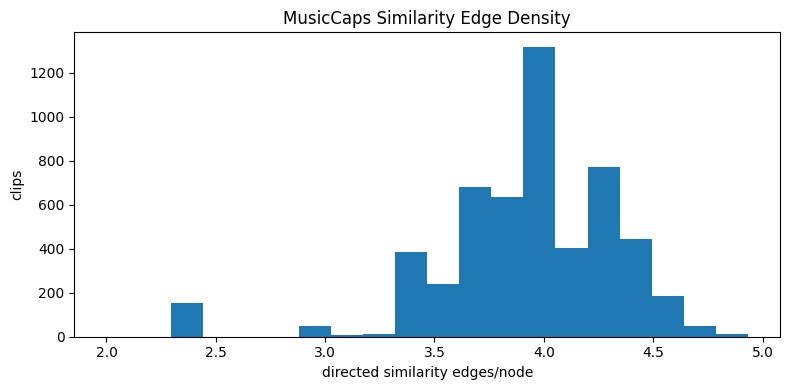

In [24]:
# ============================================================
# CELL 21 - GRAPH AUDIT PLOTS
# ============================================================
plt.figure(
    figsize=(8, 4)
)

plt.hist(
    audit_df[
        "nodes"
    ],
    bins=20
)

plt.xlabel(
    "nodes / clip"
)

plt.ylabel(
    "clips"
)

plt.title(
    "MusicCaps Graph Node Counts"
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "graph_node_distribution.png",
    dpi=180
)

plt.show()


plt.figure(
    figsize=(8, 4)
)

plt.hist(
    audit_df[
        "similarity_edges_per_node"
    ],
    bins=20
)

plt.xlabel(
    "directed similarity edges/node"
)

plt.ylabel(
    "clips"
)

plt.title(
    "MusicCaps Similarity Edge Density"
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "graph_similarity_density.png",
    dpi=180
)

plt.show()

# Keep valid audio and caption pairs

Only examples with successfully constructed graphs are kept.

Training, validation, and test sets are rebuilt from these valid pairs.

In [25]:
# ============================================================
# CELL 22 - VALID PAIRED METADATA
# ============================================================
bad_files = (
    set(
        bad_df["file"]
    )
    if len(
        bad_df
    )
    else set()
)

valid_hf_indices = {
    int(
        p.stem
    )
    for p
    in GRAPH_DIR.glob(
        "*.pt"
    )
    if p.name
    not in bad_files
}

paired_meta = (
    exp_meta[
        exp_meta[
            "hf_index"
        ].isin(
            valid_hf_indices
        )
    ]
    .copy()
    .reset_index(
        drop=True
    )
)

train_meta = (
    paired_meta[
        paired_meta["split"]
        == "training"
    ]
    .copy()
    .reset_index(drop=True)
)

val_meta = (
    paired_meta[
        paired_meta["split"]
        == "validation"
    ]
    .copy()
    .reset_index(drop=True)
)

test_meta = (
    paired_meta[
        paired_meta["split"]
        == "test"
    ]
    .copy()
    .reset_index(drop=True)
)

print(
    "valid train:",
    len(train_meta)
)

print(
    "valid val  :",
    len(val_meta)
)

print(
    "valid test :",
    len(test_meta)
)

valid train: 2580
valid val  : 1803
valid test : 969


# Normalize graph node features

The StandardScaler is fitted using training graph nodes only.

The same fitted scaler is then applied to validation and test graphs.

In [26]:
# ============================================================
# CELL 23 - FIT NODE SCALER
# ============================================================
node_scaler = StandardScaler()

for k, hf_idx in enumerate(
    train_meta[
        "hf_index"
    ].astype(int)
):
    g = torch.load(
        GRAPH_DIR
        / f"{hf_idx:05d}.pt",
        weights_only=False
    )

    node_scaler.partial_fit(
        g.x.numpy()
    )

    if (
        k + 1
    ) % 1000 == 0:
        print(
            "scaler:",
            k + 1,
            "/",
            len(train_meta)
        )


joblib.dump(
    node_scaler,
    PREPROCESSING_DIR
    / "training_node_scaler.joblib"
)

print(
    "Scaler dimension:",
    len(
        node_scaler.mean_
    )
)

scaler: 1000 / 2580
scaler: 2000 / 2580
Scaler dimension: 100


In [27]:
# ============================================================
# CELL 24 - SAVE SPLIT MANIFESTS
# ============================================================
for split_name, frame in [
    ("training", train_meta),
    ("validation", val_meta),
    ("test", test_meta),
]:
    cols = [
        "hf_index",
        "pair_id",
        "caption",
        "is_balanced_subset",
        "is_audioset_eval",
    ]

    frame[
        cols
    ].to_csv(
        SPLIT_DIR
        / f"{split_name}.csv",
        index=False
    )

print(
    "Saved split manifests:",
    SPLIT_DIR
)

Saved split manifests: /kaggle/working/task4_musiccaps_github/data_splits


# Tokenize expert captions

BERT tokenizes each MusicCaps caption.

The maximum text length is 128 tokens.

In [28]:
# ============================================================
# CELL 25 - LOAD BERT TOKENIZER
# ============================================================
tokenizer = (
    AutoTokenizer
    .from_pretrained(
        TEXT_MODEL_NAME
    )
)

tokens = tokenizer(
    paired_meta[
        "caption"
    ].tolist(),

    padding="max_length",
    truncation=True,

    max_length=
        MAX_TEXT_LENGTH,

    return_tensors="np"
)

TOKEN_IDS = (
    tokens[
        "input_ids"
    ].astype(
        np.int64
    )
)

TOKEN_MASK = (
    tokens[
        "attention_mask"
    ].astype(
        np.int64
    )
)

paired_meta[
    "token_index"
] = np.arange(
    len(
        paired_meta
    )
)

# Restore token_index into split frames.
train_meta = (
    paired_meta[
        paired_meta["split"]
        == "training"
    ]
    .copy()
    .reset_index(drop=True)
)

val_meta = (
    paired_meta[
        paired_meta["split"]
        == "validation"
    ]
    .copy()
    .reset_index(drop=True)
)

test_meta = (
    paired_meta[
        paired_meta["split"]
        == "test"
    ]
    .copy()
    .reset_index(drop=True)
)

print(
    "Token matrix:",
    TOKEN_IDS.shape
)

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Token matrix: (5352, 128)


# Build the multimodal dataset

Each item contains one scaled audio graph and the matching tokenized MusicCaps caption.

The Hugging Face row identifier is stored as hf_id because PyTorch Geometric automatically increments attributes whose names contain index during batching.

In [29]:
# ============================================================
# CELL 26 - DATASET
# ============================================================
class MusicCapsGraphTextDataset(torch.utils.data.Dataset):
    def __init__(
        self,
        frame,
        graph_dir,
        scaler,
        token_ids,
        token_mask
    ):
        self.frame = frame.reset_index(drop=True)
        self.graph_dir = Path(graph_dir)

        self.mean = torch.tensor(
            scaler.mean_,
            dtype=torch.float32
        )

        self.scale = torch.tensor(
            scaler.scale_ + 1e-8,
            dtype=torch.float32
        )

        self.token_ids = token_ids
        self.token_mask = token_mask

    def __len__(self):
        return len(self.frame)

    def __getitem__(self, idx):
        row = self.frame.iloc[idx]

        hf_idx = int(row["hf_index"])

        graph = torch.load(
            self.graph_dir / f"{hf_idx:05d}.pt",
            weights_only=False
        )

        graph.x = (graph.x - self.mean) / self.scale
        graph.x = torch.clamp(graph.x, -6.0, 6.0)

        token_idx = int(row["token_index"])

        graph.input_ids = torch.tensor(
            self.token_ids[token_idx],
            dtype=torch.long
        ).unsqueeze(0)

        graph.attention_mask = torch.tensor(
            self.token_mask[token_idx],
            dtype=torch.long
        ).unsqueeze(0)

        # IMPORTANT:
        # PyG automatically increments attributes containing the word "index"
        # during batching. Therefore do NOT use graph.hf_index here.
        # Store the Hugging Face row ID as hf_id instead.
        if "hf_index" in graph:
            del graph["hf_index"]

        graph.hf_id = torch.tensor(
            [hf_idx],
            dtype=torch.long
        )

        return graph

In [30]:
# ============================================================
# CELL 27 - LOADERS
# ============================================================
train_ds = (
    MusicCapsGraphTextDataset(
        train_meta,
        GRAPH_DIR,
        node_scaler,
        TOKEN_IDS,
        TOKEN_MASK
    )
)

val_ds = (
    MusicCapsGraphTextDataset(
        val_meta,
        GRAPH_DIR,
        node_scaler,
        TOKEN_IDS,
        TOKEN_MASK
    )
)

test_ds = (
    MusicCapsGraphTextDataset(
        test_meta,
        GRAPH_DIR,
        node_scaler,
        TOKEN_IDS,
        TOKEN_MASK
    )
)

train_loader = GeoDataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True
)

val_loader = GeoDataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_loader = GeoDataLoader(
    test_ds,
    batch_size=BATCH_SIZE,
    shuffle=False
)

batch0 = next(
    iter(
        train_loader
    )
)

print(
    batch0
)

print(
    "graphs:",
    batch0.num_graphs
)

print(
    "x:",
    batch0.x.shape
)

print(
    "input_ids:",
    batch0.input_ids.shape
)

DataBatch(x=[321, 100], edge_index=[2, 1876], edge_type=[1876], edge_weight=[1876], pair_index=[32], boundaries=[353], segmentation_mode=[32], input_ids=[32, 128], attention_mask=[32, 128], hf_id=[32], batch=[321], ptr=[33])
graphs: 32
x: torch.Size([321, 100])
input_ids: torch.Size([32, 128])


# GraphSAGE audio encoder

A two layer residual GraphSAGE network performs message passing over temporal and similarity edges.

Global mean pooling produces one graph level representation for each audio clip.

In [31]:
# ============================================================
# CELL 28 - GRAPHSAGE ENCODER
# ============================================================
class GraphEncoder(
    nn.Module
):
    def __init__(
        self,
        in_dim=100,
        hidden=GRAPH_HIDDEN,
        dropout=DROPOUT
    ):
        super().__init__()

        self.dropout = (
            dropout
        )

        self.input_proj = nn.Sequential(
            nn.Linear(
                in_dim,
                hidden
            ),

            nn.LayerNorm(
                hidden
            ),

            nn.GELU(),
        )

        self.conv1 = SAGEConv(
            hidden,
            hidden,
            aggr="mean"
        )

        self.conv2 = SAGEConv(
            hidden,
            hidden,
            aggr="mean"
        )

        self.norm1 = nn.LayerNorm(
            hidden
        )

        self.norm2 = nn.LayerNorm(
            hidden
        )

    def forward_nodes(
        self,
        batch
    ):
        h = self.input_proj(
            batch.x
        )

        z = self.conv1(
            h,
            batch.edge_index
        )

        h = self.norm1(
            h
            +
            F.dropout(
                F.gelu(z),
                p=self.dropout,
                training=self.training
            )
        )

        z = self.conv2(
            h,
            batch.edge_index
        )

        h = self.norm2(
            h
            +
            F.dropout(
                F.gelu(z),
                p=self.dropout,
                training=self.training
            )
        )

        return h

    def forward(
        self,
        batch
    ):
        h = self.forward_nodes(
            batch
        )

        g = global_mean_pool(
            h,
            batch.batch
        )

        return g

# BERT caption encoder

BERT base uncased encodes the MusicCaps caption.

Most BERT parameters are frozen and the final two transformer layers are fine tuned.

In [32]:
# ============================================================
# CELL 29 - BERT ENCODER
# ============================================================
class BERTCaptionEncoder(
    nn.Module
):
    def __init__(
        self,
        model_name=
            TEXT_MODEL_NAME,

        unfreeze_last_n=
            BERT_UNFREEZE_LAST_N
    ):
        super().__init__()

        self.bert = (
            AutoModel
            .from_pretrained(
                model_name
            )
        )

        self.hidden_size = int(
            self.bert.config.hidden_size
        )

        for p in (
            self.bert
            .parameters()
        ):
            p.requires_grad = False

        layers = []

        if hasattr(
            self.bert,
            "encoder"
        ):
            layers = (
                self.bert
                .encoder
                .layer
            )

        elif hasattr(
            self.bert,
            "transformer"
        ):
            layers = (
                self.bert
                .transformer
                .layer
            )

        if (
            unfreeze_last_n > 0
            and
            len(layers) > 0
        ):
            for layer in (
                layers[
                    -unfreeze_last_n:
                ]
            ):
                for p in (
                    layer.parameters()
                ):
                    p.requires_grad = True

    def forward(
        self,
        input_ids,
        attention_mask
    ):
        out = self.bert(
            input_ids=
                input_ids,

            attention_mask=
                attention_mask,

            return_dict=True
        )

        H = (
            out.last_hidden_state
        )

        cls = H[
            :,
            0,
            :
        ]

        return (
            H,
            cls
        )

# Shared audio and text embedding model

The graph representation and the BERT caption representation are projected into the same 256 dimensional space.

Both embeddings are normalized before cosine similarity is calculated.

In [33]:
# ============================================================
# CELL 30 - DUAL-ENCODER MODEL
# ============================================================
class GraphBERTContrastive(
    nn.Module
):
    def __init__(
        self
    ):
        super().__init__()

        self.graph_encoder = (
            GraphEncoder()
        )

        self.text_encoder = (
            BERTCaptionEncoder()
        )

        self.audio_projection = (
            nn.Sequential(
                nn.Linear(
                    GRAPH_HIDDEN,
                    EMBED_DIM
                ),

                nn.GELU(),

                nn.Dropout(
                    DROPOUT
                ),

                nn.Linear(
                    EMBED_DIM,
                    EMBED_DIM
                ),
            )
        )

        self.text_projection = (
            nn.Sequential(
                nn.Linear(
                    self.text_encoder.hidden_size,
                    EMBED_DIM
                ),

                nn.GELU(),

                nn.Dropout(
                    DROPOUT
                ),

                nn.Linear(
                    EMBED_DIM,
                    EMBED_DIM
                ),
            )
        )

        initial_scale = math.log(
            1.0
            / INITIAL_TEMPERATURE
        )

        self.logit_scale = (
            nn.Parameter(
                torch.tensor(
                    initial_scale,
                    dtype=torch.float32
                ),
                requires_grad=
                    LEARNABLE_TEMPERATURE
            )
        )

    def encode_audio(
        self,
        batch
    ):
        g = self.graph_encoder(
            batch
        )

        z = self.audio_projection(
            g
        )

        return F.normalize(
            z,
            dim=1
        )

    def encode_text(
        self,
        input_ids,
        attention_mask
    ):
        _, cls = self.text_encoder(
            input_ids,
            attention_mask
        )

        z = self.text_projection(
            cls
        )

        return F.normalize(
            z,
            dim=1
        )

    def temperature(
        self
    ):
        scale = torch.clamp(
            self.logit_scale,
            min=math.log(
                1.0
            ),
            max=math.log(
                100.0
            )
        )

        return 1.0 / torch.exp(
            scale
        )

    def forward(
        self,
        batch
    ):
        audio_emb = (
            self.encode_audio(
                batch
            )
        )

        text_emb = (
            self.encode_text(
                batch.input_ids,
                batch.attention_mask
            )
        )

        scale = torch.exp(
            torch.clamp(
                self.logit_scale,
                min=math.log(1.0),
                max=math.log(100.0)
            )
        )

        logits = (
            scale
            *
            audio_emb
            @ text_emb.T
        )

        return {
            "audio_embedding":
                audio_emb,

            "text_embedding":
                text_emb,

            "logits":
                logits,

            "temperature":
                1.0 / scale,
        }

In [34]:
# ============================================================
# CELL 31 - SHAPE SMOKE TEST
# ============================================================
model = (
    GraphBERTContrastive()
    .to(
        DEVICE
    )
)

smoke_batch = next(
    iter(
        train_loader
    )
).to(
    DEVICE
)

with torch.no_grad():
    out = model(
        smoke_batch
    )

print(
    "audio embedding:",
    out[
        "audio_embedding"
    ].shape
)

print(
    "text embedding:",
    out[
        "text_embedding"
    ].shape
)

print(
    "similarity logits:",
    out[
        "logits"
    ].shape
)

print(
    "temperature:",
    float(
        out[
            "temperature"
        ].cpu()
    )
)

del smoke_batch, out

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

audio embedding: torch.Size([32, 256])
text embedding: torch.Size([32, 256])
similarity logits: torch.Size([32, 32])
temperature: 0.06999999284744263


# Contrastive loss

Symmetric InfoNCE trains both retrieval directions.

Matched audio and caption pairs are encouraged to have higher similarity than mismatched pairs in the same batch.

In [35]:
# ============================================================
# CELL 32 - INFONCE LOSS
# ============================================================
def symmetric_infonce(
    logits
):
    n = logits.shape[0]

    target = torch.arange(
        n,
        device=logits.device
    )

    loss_audio_to_text = (
        F.cross_entropy(
            logits,
            target
        )
    )

    loss_text_to_audio = (
        F.cross_entropy(
            logits.T,
            target
        )
    )

    loss = 0.5 * (
        loss_audio_to_text
        +
        loss_text_to_audio
    )

    return (
        loss,
        loss_audio_to_text,
        loss_text_to_audio
    )

# Retrieval metrics

Recall at 1 measures how often the correct pair is ranked first.

Recall at 5 measures how often the correct pair is within the top five.

Recall at 10 measures how often the correct pair is within the top ten.

Median rank, mean rank, and mean reciprocal rank are also reported.

In [36]:
# CELL 33  Retrieval metrics

def ranks_from_similarity(
    similarity
):
    similarity = np.asarray(
        similarity
    )

    positives = np.diag(
        similarity
    )

    ranks = 1 + (
        similarity
        > positives[:, None]
    ).sum(
        axis=1
    )

    return ranks.astype(
        int
    )


def retrieval_metrics_from_similarity(
    similarity
):
    ranks = ranks_from_similarity(
        similarity
    )

    metrics = {
        "recall_at_1": float(
            np.mean(
                ranks <= 1
            )
        ),
        "recall_at_5": float(
            np.mean(
                ranks <= 5
            )
        ),
        "recall_at_10": float(
            np.mean(
                ranks <= 10
            )
        ),
        "median_rank": float(
            np.median(
                ranks
            )
        ),
        "mean_rank": float(
            np.mean(
                ranks
            )
        ),
        "mean_reciprocal_rank": float(
            np.mean(
                1.0 / ranks
            )
        ),
    }

    return (
        metrics,
        ranks,
    )

In [37]:
# ============================================================
# CELL 34 - ENCODE A SPLIT
# ============================================================
@torch.no_grad()
def encode_loader(model, loader):
    model.eval()

    audio_emb = []
    text_emb = []
    hf_indices = []

    for batch in loader:
        batch = batch.to(DEVICE)

        a = model.encode_audio(batch)

        t = model.encode_text(
            batch.input_ids,
            batch.attention_mask
        )

        audio_emb.append(
            a.cpu().numpy()
        )

        text_emb.append(
            t.cpu().numpy()
        )

        # hf_id is a normal identifier, so PyG does not increment it.
        hf_indices.extend(
            batch.hf_id
            .view(-1)
            .cpu()
            .numpy()
        )

    return (
        np.concatenate(audio_emb, axis=0),
        np.concatenate(text_emb, axis=0),
        np.asarray(hf_indices, dtype=np.int64)
    )

In [38]:
# ============================================================
# CELL 35 - VALIDATION RETRIEVAL
# ============================================================
def evaluate_retrieval(
    model,
    loader
):
    audio_emb, text_emb, hf_indices = (
        encode_loader(
            model,
            loader
        )
    )

    similarity = (
        text_emb
        @ audio_emb.T
    )

    text_to_audio, t2a_ranks = (
        retrieval_metrics_from_similarity(
            similarity
        )
    )

    audio_to_text, a2t_ranks = (
        retrieval_metrics_from_similarity(
            similarity.T
        )
    )

    return {
        "caption_to_audio":
            text_to_audio,

        "audio_to_caption":
            audio_to_text,

        "similarity":
            similarity,

        "audio_embeddings":
            audio_emb,

        "text_embeddings":
            text_emb,

        "hf_indices":
            hf_indices,

        "caption_to_audio_ranks":
            t2a_ranks,

        "audio_to_caption_ranks":
            a2t_ranks,
    }

# Optimizer

Fine tuned BERT parameters use a smaller learning rate.

New graph and projection layers use a larger learning rate.

In [39]:
# ============================================================
# CELL 36 - DIFFERENTIAL OPTIMIZER
# ============================================================
bert_params = []
new_params = []

for name, p in (
    model.named_parameters()
):
    if not p.requires_grad:
        continue

    if (
        "text_encoder.bert"
        in name
    ):
        bert_params.append(
            p
        )

    else:
        new_params.append(
            p
        )


optimizer = torch.optim.AdamW([
    {
        "params":
            bert_params,

        "lr":
            LR_BERT,

        "weight_decay":
            WEIGHT_DECAY,
    },

    {
        "params":
            new_params,

        "lr":
            LR_NEW,

        "weight_decay":
            WEIGHT_DECAY,
    },
])


scheduler = (
    torch.optim.lr_scheduler
    .ReduceLROnPlateau(
        optimizer,
        mode="max",
        factor=0.5,
        patience=1
    )
)

# Train the dual encoder

The best Epoch is selected using the average validation Recall at 10 from both retrieval directions.

The best model parameters remain in memory only.

No model weight file is saved.

In [40]:
# ============================================================
# CELL 37 - TRAIN ONE EPOCH
# ============================================================
def train_epoch(
    model,
    loader,
    optimizer
):
    model.train()

    total_loss = 0.0
    total_a2t = 0.0
    total_t2a = 0.0
    total_n = 0

    scaler = torch.amp.GradScaler(
        "cuda",
        enabled=AMP,
    )

    for batch in loader:
        batch = batch.to(
            DEVICE
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        with torch.amp.autocast(
            device_type=DEVICE.type,
            dtype=(
                torch.float16
                if DEVICE.type == "cuda"
                else torch.bfloat16
            ),
            enabled=AMP,
        ):
            out = model(
                batch
            )

            loss, a2t, t2a = (
                symmetric_infonce(
                    out["logits"]
                )
            )

        scaler.scale(
            loss
        ).backward()

        scaler.unscale_(
            optimizer
        )

        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            2.0
        )

        scaler.step(
            optimizer
        )

        scaler.update()

        b = batch.num_graphs

        total_loss += (
            float(
                loss.detach().cpu()
            )
            * b
        )

        total_a2t += (
            float(
                a2t.detach().cpu()
            )
            * b
        )

        total_t2a += (
            float(
                t2a.detach().cpu()
            )
            * b
        )

        total_n += b

    return {
        "loss":
            total_loss
            / max(
                total_n,
                1
            ),

        "audio_to_text_loss":
            total_a2t
            / max(
                total_n,
                1
            ),

        "text_to_audio_loss":
            total_t2a
            / max(
                total_n,
                1
            ),

        "temperature":
            float(
                model.temperature()
                .detach()
                .cpu()
            )
    }

In [41]:
# CELL 38  Full training loop without model weight files

history_rows = []

best_validation_score = -np.inf
best_epoch = -1
best_state_dict = None
epochs_without_improvement = 0

for epoch in range(
    1,
    EPOCHS + 1,
):
    training_stats = train_epoch(
        model,
        train_loader,
        optimizer,
    )

    validation_evaluation = (
        evaluate_retrieval(
            model,
            val_loader,
        )
    )

    validation_caption_to_audio = (
        validation_evaluation[
            "caption_to_audio"
        ]
    )

    validation_audio_to_caption = (
        validation_evaluation[
            "audio_to_caption"
        ]
    )

    validation_score = (
        0.5
        * (
            validation_caption_to_audio[
                "recall_at_10"
            ]
            + validation_audio_to_caption[
                "recall_at_10"
            ]
        )
    )

    scheduler.step(
        validation_score
    )

    history_rows.append({
        "epoch": epoch,
        "training_symmetric_infonce_loss": training_stats[
            "loss"
        ],
        "contrastive_temperature": training_stats[
            "temperature"
        ],
        "validation_caption_to_audio_recall_at_1": validation_caption_to_audio[
            "recall_at_1"
        ],
        "validation_caption_to_audio_recall_at_5": validation_caption_to_audio[
            "recall_at_5"
        ],
        "validation_caption_to_audio_recall_at_10": validation_caption_to_audio[
            "recall_at_10"
        ],
        "validation_audio_to_caption_recall_at_1": validation_audio_to_caption[
            "recall_at_1"
        ],
        "validation_audio_to_caption_recall_at_5": validation_audio_to_caption[
            "recall_at_5"
        ],
        "validation_audio_to_caption_recall_at_10": validation_audio_to_caption[
            "recall_at_10"
        ],
        "validation_mean_recall_at_10": validation_score,
    })

    print()
    print(
        "Epoch",
        epoch,
        "of",
        EPOCHS,
    )

    print(
        "Training symmetric InfoNCE loss:",
        f"{training_stats['loss']:.4f}",
    )

    print(
        "Contrastive temperature:",
        f"{training_stats['temperature']:.4f}",
    )

    print(
        "Validation Caption to Audio Recall at 1:",
        f"{validation_caption_to_audio['recall_at_1']:.4f}",
    )

    print(
        "Validation Caption to Audio Recall at 5:",
        f"{validation_caption_to_audio['recall_at_5']:.4f}",
    )

    print(
        "Validation Caption to Audio Recall at 10:",
        f"{validation_caption_to_audio['recall_at_10']:.4f}",
    )

    print(
        "Validation Audio to Caption Recall at 1:",
        f"{validation_audio_to_caption['recall_at_1']:.4f}",
    )

    print(
        "Validation Audio to Caption Recall at 5:",
        f"{validation_audio_to_caption['recall_at_5']:.4f}",
    )

    print(
        "Validation Audio to Caption Recall at 10:",
        f"{validation_audio_to_caption['recall_at_10']:.4f}",
    )

    if (
        validation_score
        > best_validation_score
        + 1e-6
    ):
        best_validation_score = (
            validation_score
        )

        best_epoch = epoch
        epochs_without_improvement = 0

        best_state_dict = {
            name: value
            .detach()
            .cpu()
            .clone()
            for name, value
            in model.state_dict().items()
        }

        print(
            "Best model parameters in memory updated."
        )

    else:
        epochs_without_improvement += 1

    if (
        epochs_without_improvement
        >= PATIENCE
    ):
        print(
            "Early stopping triggered."
        )
        break

history = pd.DataFrame(
    history_rows
)

history.to_csv(
    METRICS_DIR
    / "training_history.csv",
    index=False,
)

if best_state_dict is None:
    raise RuntimeError(
        "No best model state was recorded."
    )

model.load_state_dict(
    best_state_dict
)

model.eval()

print()
print(
    "Best Epoch:",
    best_epoch,
)

print(
    "Best validation mean Recall at 10:",
    f"{best_validation_score:.4f}",
)


Epoch 1 of 20
Training symmetric InfoNCE loss: 3.1518
Contrastive temperature: 0.0715
Validation Caption to Audio Recall at 1: 0.0028
Validation Caption to Audio Recall at 5: 0.0144
Validation Caption to Audio Recall at 10: 0.0316
Validation Audio to Caption Recall at 1: 0.0083
Validation Audio to Caption Recall at 5: 0.0261
Validation Audio to Caption Recall at 10: 0.0405
Best model parameters in memory updated.

Epoch 2 of 20
Training symmetric InfoNCE loss: 2.5646
Contrastive temperature: 0.0717
Validation Caption to Audio Recall at 1: 0.0094
Validation Caption to Audio Recall at 5: 0.0444
Validation Caption to Audio Recall at 10: 0.0710
Validation Audio to Caption Recall at 1: 0.0089
Validation Audio to Caption Recall at 5: 0.0383
Validation Audio to Caption Recall at 10: 0.0616
Best model parameters in memory updated.

Epoch 3 of 20
Training symmetric InfoNCE loss: 2.1880
Contrastive temperature: 0.0715
Validation Caption to Audio Recall at 1: 0.0105
Validation Caption to Audio R

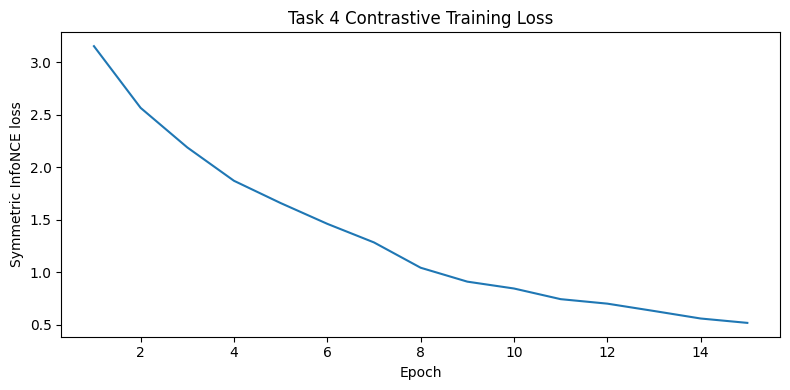

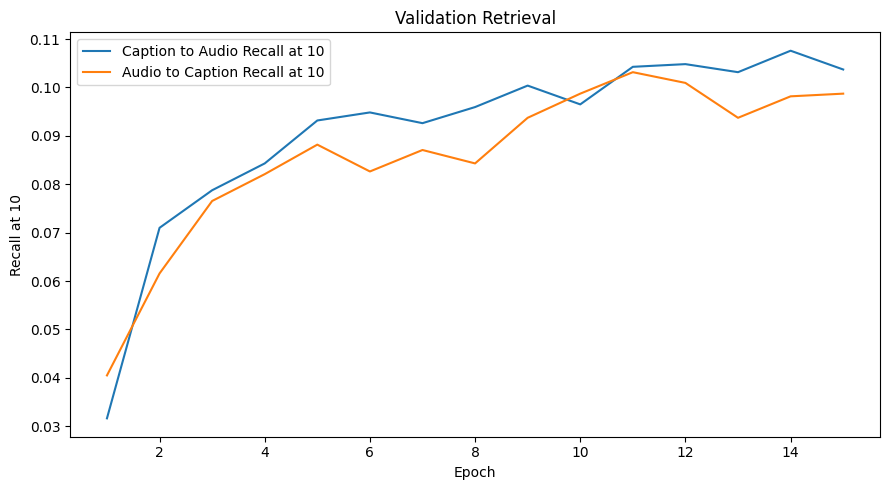

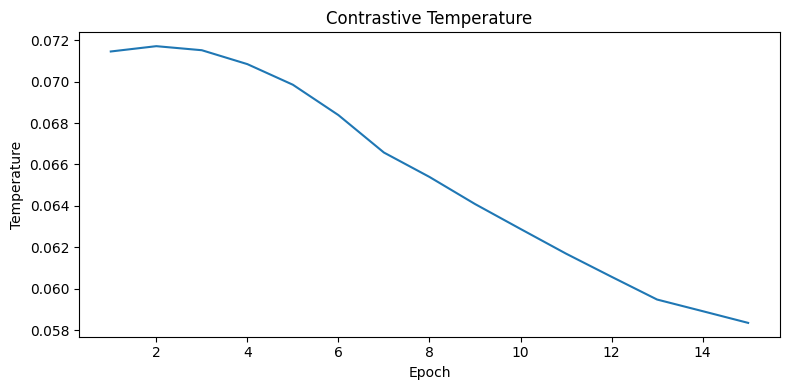

In [42]:
# CELL 39  Training curves

plt.figure(
    figsize=(8, 4)
)

plt.plot(
    history["epoch"],
    history[
        "training_symmetric_infonce_loss"
    ],
)

plt.xlabel("Epoch")
plt.ylabel("Symmetric InfoNCE loss")
plt.title("Task 4 Contrastive Training Loss")
plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "contrastive_loss.png",
    dpi=180,
    bbox_inches="tight",
)

plt.show()


plt.figure(
    figsize=(9, 5)
)

plt.plot(
    history["epoch"],
    history[
        "validation_caption_to_audio_recall_at_10"
    ],
    label="Caption to Audio Recall at 10",
)

plt.plot(
    history["epoch"],
    history[
        "validation_audio_to_caption_recall_at_10"
    ],
    label="Audio to Caption Recall at 10",
)

plt.xlabel("Epoch")
plt.ylabel("Recall at 10")
plt.title("Validation Retrieval")
plt.legend()
plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "validation_retrieval.png",
    dpi=180,
    bbox_inches="tight",
)

plt.show()


plt.figure(
    figsize=(8, 4)
)

plt.plot(
    history["epoch"],
    history[
        "contrastive_temperature"
    ],
)

plt.xlabel("Epoch")
plt.ylabel("Temperature")
plt.title("Contrastive Temperature")
plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "temperature_curve.png",
    dpi=180,
    bbox_inches="tight",
)

plt.show()

# Final test retrieval

After model selection is complete, the held out MusicCaps test split is evaluated in both retrieval directions.

In [43]:
# CELL 40  Final test retrieval

test_eval = evaluate_retrieval(
    model,
    test_loader,
)

test_caption_to_audio = (
    test_eval[
        "caption_to_audio"
    ]
)

test_audio_to_caption = (
    test_eval[
        "audio_to_caption"
    ]
)

print(
    "Caption to Audio retrieval"
)

print(
    json.dumps(
        test_caption_to_audio,
        indent=2,
    )
)

print()

print(
    "Audio to Caption retrieval"
)

print(
    json.dumps(
        test_audio_to_caption,
        indent=2,
    )
)

Caption to Audio retrieval
{
  "recall_at_1": 0.033023735810113516,
  "recall_at_5": 0.1021671826625387,
  "recall_at_10": 0.16305469556243551,
  "median_rank": 69.0,
  "mean_rank": 137.4984520123839,
  "mean_reciprocal_rank": 0.07844522149219639
}

Audio to Caption retrieval
{
  "recall_at_1": 0.023735810113519093,
  "recall_at_5": 0.09494324045407637,
  "recall_at_10": 0.16408668730650156,
  "median_rank": 69.0,
  "mean_rank": 129.422084623323,
  "mean_reciprocal_rank": 0.07219022110963814
}


In [44]:
# CELL 41  Retrieval table and random chance baseline

number_of_test_pairs = len(
    test_meta
)

random_chance = {
    "recall_at_1": min(
        1.0,
        1.0
        / number_of_test_pairs,
    ),
    "recall_at_5": min(
        1.0,
        5.0
        / number_of_test_pairs,
    ),
    "recall_at_10": min(
        1.0,
        10.0
        / number_of_test_pairs,
    ),
}

retrieval_table = pd.DataFrame([
    {
        "direction": "Caption to Audio",
        **test_caption_to_audio,
    },
    {
        "direction": "Audio to Caption",
        **test_audio_to_caption,
    },
    {
        "direction": "Random chance",
        "recall_at_1": random_chance[
            "recall_at_1"
        ],
        "recall_at_5": random_chance[
            "recall_at_5"
        ],
        "recall_at_10": random_chance[
            "recall_at_10"
        ],
        "median_rank": np.nan,
        "mean_rank": np.nan,
        "mean_reciprocal_rank": np.nan,
    },
])

display(
    retrieval_table.round(
        4
    )
)

retrieval_table.to_csv(
    METRICS_DIR
    / "retrieval_metrics.csv",
    index=False,
)

,direction,recall_at_1,recall_at_5,recall_at_10,median_rank,mean_rank,mean_reciprocal_rank
0,Caption to Audio,0.0330,0.1022,0.1631,69.0,137.4985,0.0784
1,Audio to Caption,0.0237,0.0949,0.1641,69.0,129.4221,0.0722
2,Random chance,0.0010,0.0052,0.0103,NaN,NaN,NaN


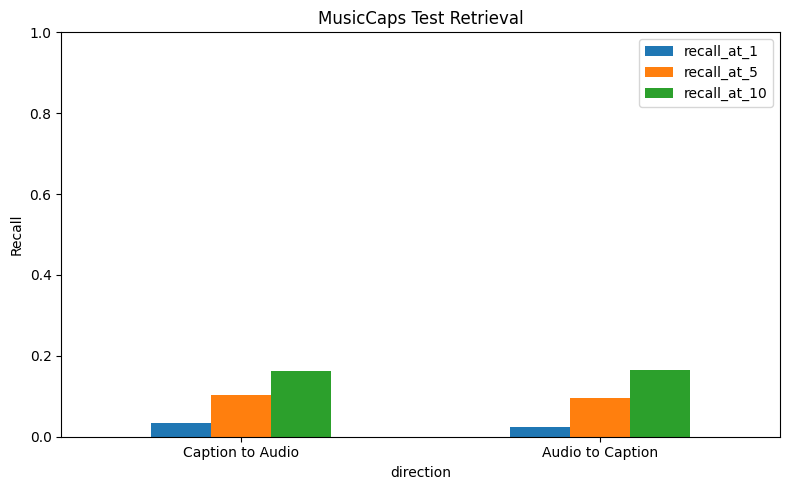

In [45]:
# CELL 42  Test retrieval plot

plot_retrieval = (
    retrieval_table
    .iloc[:2]
    .set_index(
        "direction"
    )
    [
        [
            "recall_at_1",
            "recall_at_5",
            "recall_at_10",
        ]
    ]
)

axis = plot_retrieval.plot(
    kind="bar",
    figsize=(8, 5),
)

axis.set_ylabel("Recall")
axis.set_ylim(0, 1)
axis.set_title("MusicCaps Test Retrieval")
plt.xticks(rotation=0)
plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "test_retrieval_metrics.png",
    dpi=180,
    bbox_inches="tight",
)

plt.show()

# Shared space diagnostics

Paired audio and caption similarity is compared with random non paired similarity.

The audio and text embedding centroids are also compared to measure the remaining modality gap.

In [46]:
# ============================================================
# CELL 43 - MODALITY-GAP DIAGNOSTICS
# ============================================================
audio_test_emb = (
    test_eval[
        "audio_embeddings"
    ]
)

text_test_emb = (
    test_eval[
        "text_embeddings"
    ]
)

paired_cosine = np.sum(
    audio_test_emb
    *
    text_test_emb,
    axis=1
)

rng = np.random.default_rng(
    SEED
)

perm = rng.permutation(
    len(
        text_test_emb
    )
)

nonpaired_cosine = np.sum(
    audio_test_emb
    *
    text_test_emb[
        perm
    ],
    axis=1
)

audio_centroid = (
    audio_test_emb
    .mean(
        axis=0
    )
)

text_centroid = (
    text_test_emb
    .mean(
        axis=0
    )
)

audio_centroid /= (
    np.linalg.norm(
        audio_centroid
    )
    + 1e-8
)

text_centroid /= (
    np.linalg.norm(
        text_centroid
    )
    + 1e-8
)

centroid_cosine = float(
    np.dot(
        audio_centroid,
        text_centroid
    )
)

modality_gap = (
    1.0
    - centroid_cosine
)

diagnostic = {
    "mean_paired_cosine":
        float(
            paired_cosine.mean()
        ),

    "mean_random_nonpaired_cosine":
        float(
            nonpaired_cosine.mean()
        ),

    "modality_centroid_cosine":
        centroid_cosine,

    "modality_gap_1_minus_cosine":
        modality_gap,
}

print(
    json.dumps(
        diagnostic,
        indent=2
    )
)

with open(
    METRICS_DIR
    / "modality_diagnostics.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        diagnostic,
        file,
        indent=2,
    )


{
  "mean_paired_cosine": 0.38171035051345825,
  "mean_random_nonpaired_cosine": 0.08168957382440567,
  "modality_centroid_cosine": 0.6931846141815186,
  "modality_gap_1_minus_cosine": 0.30681538581848145
}


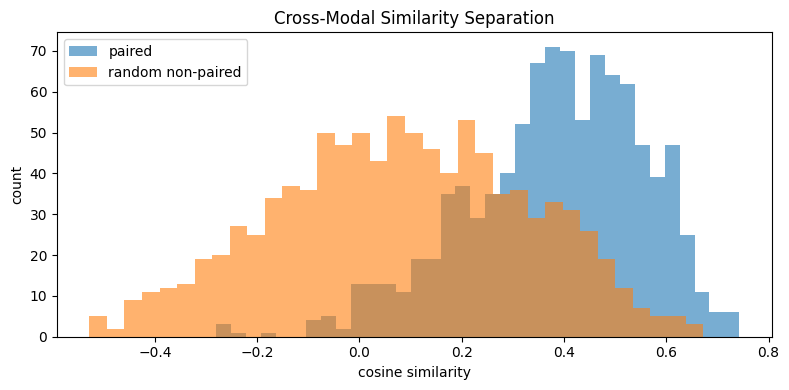

In [47]:
# ============================================================
# CELL 44 - PAIRED VS NON-PAIRED SIMILARITY PLOT
# ============================================================
plt.figure(
    figsize=(8, 4)
)

plt.hist(
    paired_cosine,
    bins=35,
    alpha=0.6,
    label="paired"
)

plt.hist(
    nonpaired_cosine,
    bins=35,
    alpha=0.6,
    label="random non-paired"
)

plt.xlabel(
    "cosine similarity"
)

plt.ylabel(
    "count"
)

plt.title(
    "Cross-Modal Similarity Separation"
)

plt.legend()

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "paired_vs_nonpaired_similarity.png",
    dpi=180
)

plt.show()

# Joint embedding visualization

Audio and text embeddings are standardized, reduced with Principal Component Analysis, and visualized with t distributed Stochastic Neighbor Embedding.

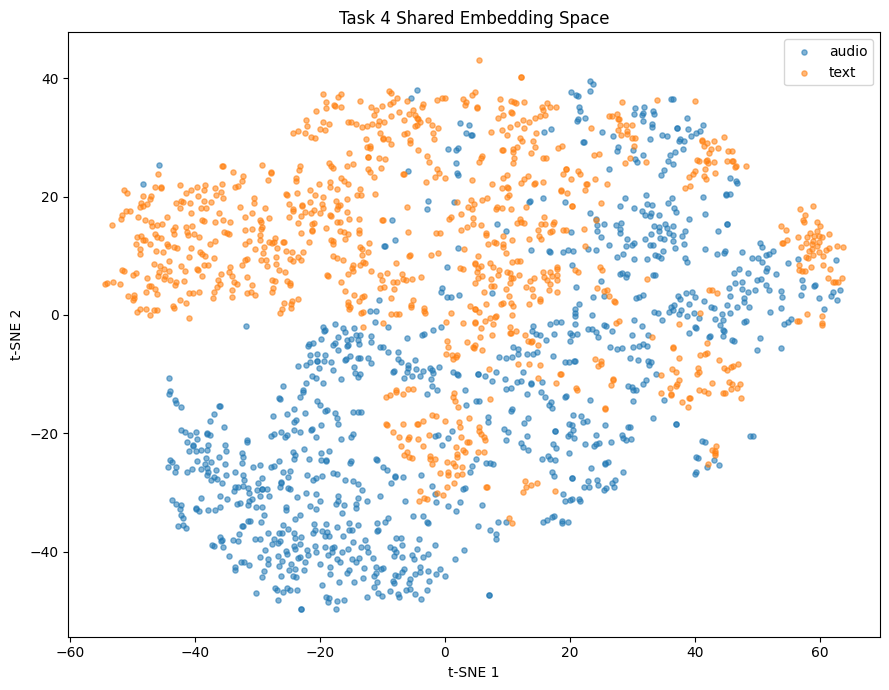

In [48]:
# ============================================================
# CELL 45 - PCA -> t-SNE OF JOINT SPACE
# ============================================================
joint = np.vstack([
    audio_test_emb,
    text_test_emb
])

modality = np.array(
    ["audio"]
    * len(audio_test_emb)
    +
    ["text"]
    * len(text_test_emb)
)

joint_scaled = (
    StandardScaler()
    .fit_transform(
        joint
    )
)

pca_dim = min(
    50,
    joint_scaled.shape[1],
    joint_scaled.shape[0] - 1
)

joint_pca = (
    PCA(
        n_components=pca_dim,
        random_state=SEED
    )
    .fit_transform(
        joint_scaled
    )
)

perplexity = min(
    30,
    max(
        5,
        len(
            joint_pca
        ) // 30
    )
)

joint_tsne = (
    TSNE(
        n_components=2,
        random_state=SEED,
        init="pca",
        learning_rate="auto",
        perplexity=perplexity,
        max_iter=1500
    )
    .fit_transform(
        joint_pca
    )
)


plt.figure(
    figsize=(9, 7)
)

for label in [
    "audio",
    "text"
]:
    mask = (
        modality
        == label
    )

    plt.scatter(
        joint_tsne[
            mask,
            0
        ],
        joint_tsne[
            mask,
            1
        ],
        s=14,
        alpha=0.55,
        label=label
    )

plt.xlabel(
    "t-SNE 1"
)

plt.ylabel(
    "t-SNE 2"
)

plt.title(
    "Task 4 Shared Embedding Space"
)

plt.legend()

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "joint_embedding_tsne.png",
    dpi=180
)

plt.show()

joint_tsne_frame = pd.DataFrame({
    "modality": modality,
    "embedding_dimension_1": joint_tsne[
        :,
        0,
    ],
    "embedding_dimension_2": joint_tsne[
        :,
        1,
    ],
})

joint_tsne_frame.to_csv(
    METRICS_DIR
    / "joint_embedding_tsne_coordinates.csv",
    index=False,
)


# Ten qualitative retrieval examples

Ten test captions are selected.

For every caption the notebook saves the top three retrieved audio clips, similarity scores, and the exact paired clip rank.

In [49]:
# ============================================================
# CELL 46 - BUILD TEST INDEX LOOKUP
# ============================================================
test_hf_indices = np.asarray(
    test_eval["hf_indices"],
    dtype=np.int64
)

test_frame_by_hf = (
    test_meta
    .set_index("hf_index", drop=False)
)

assert len(test_hf_indices) == len(test_meta)

missing_ids = sorted(
    set(test_hf_indices.tolist())
    - set(test_frame_by_hf.index.astype(int).tolist())
)

assert not missing_ids, (
    "Some encoded Hugging Face IDs are not present in test_meta: "
    f"{missing_ids[:10]}. "
    "Re-run CELL 26, CELL 27, CELL 34, and CELL 40 in that order."
)

test_index_to_position = {
    int(hf_idx): pos
    for pos, hf_idx in enumerate(test_hf_indices)
}

print("Test lookup OK.")
print("Encoded test IDs:", len(test_hf_indices))
print("Unique test IDs :", len(np.unique(test_hf_indices)))

Test lookup OK.
Encoded test IDs: 969
Unique test IDs : 969


In [50]:
# ============================================================
# CELL 47 - GENERATE 10 TOP-3 RETRIEVAL CASES
# ============================================================
similarity = (
    test_eval[
        "similarity"
    ]
)

num_cases = min(
    10,
    len(
        test_meta
    )
)

query_positions = np.linspace(
    0,
    len(
        test_meta
    ) - 1,
    num_cases
).astype(
    int
)

retrieval_rows = []

for case_id, qpos in enumerate(
    query_positions,
    start=1
):
    query_hf = int(
        test_hf_indices[
            qpos
        ]
    )

    query_caption = str(
        test_frame_by_hf.loc[
            query_hf,
            "caption"
        ]
    )

    order = np.argsort(
        similarity[
            qpos
        ]
    )[::-1]

    true_rank = int(
        np.where(
            order == qpos
        )[0][0]
        + 1
    )

    for rank, audio_pos in enumerate(
        order[:3],
        start=1
    ):
        retrieved_hf = int(
            test_hf_indices[
                audio_pos
            ]
        )

        retrieval_rows.append({
            "case":
                case_id,

            "query_hf_index":
                query_hf,

            "query_caption":
                query_caption,

            "true_pair_rank":
                true_rank,

            "retrieval_rank":
                rank,

            "retrieved_hf_index":
                retrieved_hf,

            "similarity":
                float(
                    similarity[
                        qpos,
                        audio_pos
                    ]
                ),

            "retrieved_pair_caption":
                str(
                    test_frame_by_hf.loc[
                        retrieved_hf,
                        "caption"
                    ]
                ),

            "is_exact_pair":
                bool(
                    audio_pos
                    == qpos
                )
        })


qualitative_df = pd.DataFrame(
    retrieval_rows
)

display(
    qualitative_df[
        [
            "case",
            "retrieval_rank",
            "true_pair_rank",
            "similarity",
            "is_exact_pair",
            "query_caption",
            "retrieved_pair_caption",
        ]
    ]
)

qualitative_df.to_csv(
    QUAL_DIR
    / "caption_to_audio_top3.csv",
    index=False
)

,case,retrieval_rank,true_pair_rank,similarity,is_exact_pair,query_caption,retrieved_pair_caption
0,1,1,2,0.628973,False,Digital drums are playing a four on the floor ...,The rock song features a passionate male vocal...
1,1,2,2,0.618624,True,Digital drums are playing a four on the floor ...,Digital drums are playing a four on the floor ...
2,1,3,2,0.585216,False,Digital drums are playing a four on the floor ...,The low quality recording features a live perf...
3,2,1,32,0.658387,False,Techno or house music with a four on the floor...,This is a breakbeat from a DJ set performance....
4,2,2,32,0.650930,False,Techno or house music with a four on the floor...,This beat contains a bassline that stands out ...
5,2,3,32,0.650108,False,Techno or house music with a four on the floor...,The low quality recording features a club hous...
6,3,1,60,0.609848,False,A male singer sings this cool melody with fema...,The Reggae song features a flat male vocal sin...
7,3,2,60,0.601739,False,A male singer sings this cool melody with fema...,The R&B song features a passionate male vocali...
8,3,3,60,0.594564,False,A male singer sings this cool melody with fema...,This song contains digital drums playing a hip...
9,4,1,27,0.649312,False,"The Latin Music features a ""4 on the floor"" pu...",This reggae song features a male voice singing...


# Play the qualitative examples

This optional notebook cell plays the retrieved clips for manual inspection.

The saved CSV file is the GitHub artifact.

In [51]:
# CELL 48  Optional audio playback for qualitative retrieval cases

for case_id in sorted(
    qualitative_df[
        "case"
    ].unique()
):
    case_frame = qualitative_df[
        qualitative_df[
            "case"
        ]
        == case_id
    ]

    query_caption = str(
        case_frame
        .iloc[0][
            "query_caption"
        ]
    )

    true_rank = int(
        case_frame
        .iloc[0][
            "true_pair_rank"
        ]
    )

    print()
    print(
        "Case",
        case_id,
    )

    print(
        "Query caption:",
        query_caption,
    )

    print(
        "Exact paired clip rank:",
        true_rank,
    )

    for row in case_frame.itertuples():
        print(
            "Retrieved rank",
            row.retrieval_rank,
            "similarity",
            round(
                float(
                    row.similarity
                ),
                4,
            ),
            "exact pair",
            bool(
                row.is_exact_pair
            ),
        )

        print(
            "Retrieved clip caption:",
            row.retrieved_pair_caption,
        )

        audio_item = audio_ds[
            int(
                row.retrieved_hf_index
            )
        ]

        waveform = decode_audio_item(
            audio_item
        )

        display(
            IPyAudio(
                waveform,
                rate=SR,
            )
        )


Case 1
Query caption: Digital drums are playing a four on the floor rhythm with a kick on every beat along with a bassline and a keyboard sound playing short rhythmic chords and a e-guitar playing a simple melody along. A male voice is singing in a higher key. This song may be playing at a folkfest.
Exact paired clip rank: 2
Retrieved rank 1 similarity 0.629 exact pair False
Retrieved clip caption: The rock song features a passionate male vocal, alongside harmonizing background vocal, singing over tremolo electric guitar located in the left channel, arpeggiated electric guitar melody in the right channel of the stereo image, shimmering tambourine, groovy bass guitar, punchy kick and snare hits, reverberant percussive hit and energetic crash cymbal. It sounds groovy, energetic and kind of addictive thanks to that cadence.


Retrieved rank 2 similarity 0.6186 exact pair True
Retrieved clip caption: Digital drums are playing a four on the floor rhythm with a kick on every beat along with a bassline and a keyboard sound playing short rhythmic chords and a e-guitar playing a simple melody along. A male voice is singing in a higher key. This song may be playing at a folkfest.


Retrieved rank 3 similarity 0.5852 exact pair False
Retrieved clip caption: The low quality recording features a live performance of a rock & roll song performed by passionate female vocal and male vocal ad libs, followed by groovy piano melody, funky electric guitar melody, groovy bass guitar, shimmering hi hats, punchy snare and soft kick hits. It is a bit noisy and there are some subtle microphone feedback sounds in the middle of the performance. It sounds energetic, vintage and passionate.



Case 2
Query caption: Techno or house music with a four on the floor kick pattern, off beat hi-hat pattern, synth chords with delay and a chopped vocal sample. It is mid-tempo and minimal for dancing.
Exact paired clip rank: 32
Retrieved rank 1 similarity 0.6584 exact pair False
Retrieved clip caption: This is a breakbeat from a DJ set performance. The DJ is using the turntable to repeat the male vocal sample and add the scratching effect. In the background, the electronic drums and a strong bass are providing the rhythmic background at a medium tempo. It has a groovy, urban atmosphere. This performance could be used in a crime movie or a TV show with an urban ghetto setting.


Retrieved rank 2 similarity 0.6509 exact pair False
Retrieved clip caption: This beat contains a bassline that stands out also serving as melody. A rather complex digital drum is played along with male and female short vocal samples. A little tabla samples spices up the rhythm section along with a synthesizer hit. This instrumental is full of rhythmic elements. This song may be playing at home practicing rapping.


Retrieved rank 3 similarity 0.6501 exact pair False
Retrieved clip caption: The low quality recording features a club house song that consists of groovy 808 bass, crispy claps, shimmering muffled shakers and high pitched harmonizing male vocals singing over it. The recording is thin and it sounds groovy, fun and happy.



Case 3
Query caption: A male singer sings this cool melody with female and male backup singers in vocal harmony. The song is medium tempo with a groovy bass line, percussive drum rhythm, keyboard harmony and guitar rhythm. The song is exciting and groovy. The song is a R&B cover of a famous pop song. The song has poor audio quality.
Exact paired clip rank: 60
Retrieved rank 1 similarity 0.6098 exact pair False
Retrieved clip caption: The Reggae song features a flat male vocal singing, alongside wide background harmonizing female vocals, over metallic snare, simple kick hits, offbeat acoustic rhythm guitar chords, groovy bass, electric guitar licks and tinny percussive elements widely spread in the stereo image. Sounds happy and uplifting, like something you can listen to while chilling at the beach.


Retrieved rank 2 similarity 0.6017 exact pair False
Retrieved clip caption: The R&B song features a passionate male vocalist singing over a wide funky electric guitar melody, smooth bass guitar, punchy kick and snare hits, shimmering hi hats, snappy rimshots and soft crash cymbals. The rimshots are present in the first half of the loop, while a more energetic second part of the loop consists of punchy snare hits. It sounds emotional and heartfelt, as the vocal is slightly distorted.


Retrieved rank 3 similarity 0.5946 exact pair False
Retrieved clip caption: This song contains digital drums playing a hiphop kinda feel along with a bassline. The most energy comes from the male voice singing with autotune and a lot of backing voices cheering and singing along: Then a male voice starts rapping. The backing voices are spread across the both sides of the speakers. This song may be playing outside chilling with your friends.



Case 4
Query caption: The Latin Music features a "4 on the floor" punchy kick pattern, shimmering shakers, groovy bass that glues everything together, staccato brass melody and repetitive flat male vocal singing over it. The song is gradually speeding up, bringing the energy up along with it. It gives off happy and fun vibes as it sounds like something you would want to dance to.
Exact paired clip rank: 27
Retrieved rank 1 similarity 0.6493 exact pair False
Retrieved clip caption: This reggae song features a male voice singing the main melody. Another voice is singing in harmony with the main voice. This is accompanied by reggae percussion. A timbale is played on every third count. Jam blocks are also played in the background. The bass plays a funky bassline with a reggae feel. Synth sounds are played in the background. This song can be played in a bar.


Retrieved rank 2 similarity 0.6263 exact pair False
Retrieved clip caption: A male voice is rapping/singing in a higher pitch. His voice is strongly processed with effects. Also with autotune. The instrumental contains digital drums with a strong kick with a subbass. With every hit a synthesizer pad is playing along. This is an amateur recording. This song may be playing in a recording studio.


Retrieved rank 3 similarity 0.6178 exact pair False
Retrieved clip caption: The Electro Pop song features a buzzy sustained synth lead, "4 on the floor" kick, short reversed snare hits, claps, shimmering hi hats, groovy piano chords, sustained synth pad chord and arpeggiated synth melody. It sounds energetic and like something you would hear in clubs.



Case 5
Query caption: An acoustic piano is playing a minor chord progression while two men are singing in the mid and higher register. They seem to be imitating cat sounds so the crowd is laughing. This is an amateur recording. This song may be playing in a comedic live performance on stage.
Exact paired clip rank: 203
Retrieved rank 1 similarity 0.5949 exact pair False
Retrieved clip caption: Salsa music featuring heavy percussion including timbale, bongos, guiro among others, a brass section with trumpet and trombone. The music features full band melodies and drum breaks with complex chord progressions and group male vocals.


Retrieved rank 2 similarity 0.5481 exact pair False
Retrieved clip caption: A male singer sings various songs in live audience situations. The songs have a different tempo and are mostly accompanied by a band. The songs are sung at live venues with people screaming and cheering. The songs are modern pop hits , recorded in poor audio quality with hissing noises.


Retrieved rank 3 similarity 0.5404 exact pair False
Retrieved clip caption: A female singer sings this traditional melody. The song is medium tempo with a clicking percussion rhythm, guitar strumming accompaniment and tap dancing tones. The song is energetic and passionate. The song has very poor audio quality.



Case 6
Query caption: The music contains an energetic female voice which is sharp and clear. It is between rapping and singing. In the background are electronic music effects, at medium to high pitch. The atmosphere is smooth and confident. A drum kit plays a mid tempo pattern and It is very digital sounding.
Exact paired clip rank: 65
Retrieved rank 1 similarity 0.5387 exact pair False
Retrieved clip caption: The low quality recording features a compilation of a few different recordings that mostly consist of female vocals talking with each other and a loud crowd talking in the background. However, in the first section, there are also some claps and female vocals mumbling a song. The arrangement of the recordings is weird, but in context it probably makes sense.


Retrieved rank 2 similarity 0.5299 exact pair False
Retrieved clip caption: The low quality recording features a funk song that consists of passionate male vocal singing over shimmering open hats and shakers, funky and groovy keys melody, groovy bass, wooden percussive elements and "4 on the floor" kick pattern. It is noisy, but also funky and the stereo image is unbalanced, as the song is leaning towards the right channel.


Retrieved rank 3 similarity 0.5105 exact pair False
Retrieved clip caption: This is a trap music piece done in the style of Michael Jackson. There is a male vocalist singing in a very accentuated manner. In the rhythmic background loud electronic drums can be heard with the cicada beat on the hihats which is essential to the trap scene. There is a strong electronic bass sound accompanied every now and then by an electric guitar sample.



Case 7
Query caption: The low quality recording features a live performance that consists of a Spanish guitar solo melody, groovy double bass and acoustic rhythm guitar chords. The recording is noisy, in mono and it sounds passionate and uptempo - like something you would dance to with your friends in a latin club.
Exact paired clip rank: 121
Retrieved rank 1 similarity 0.644 exact pair False
Retrieved clip caption: A female singer sings this beautiful melody with male and female backup singers in vocal harmony. The song is medium tempo with an acoustic guitar playing rhythm and strong string bass line with no percussion instrumentation. The song is emotional and heartfelt. The song has acapella influences and is soulful. The song is of poor audio recording quality.


Retrieved rank 2 similarity 0.6275 exact pair False
Retrieved clip caption: The song is an instrumental. The tempo is medium with a guitarist playing traditional flamenco style guitar in a rhumba rhythm. The song has a Latin dance groove and sounds delightful. The song has a poor audio quality.


Retrieved rank 3 similarity 0.6198 exact pair False
Retrieved clip caption: The low quality recording features a reverberant sound of boomy bass guitar, muffled drums, simple electric guitar chords and melodic male vocal singing over it. It sounds like it was recorded on a phone, since it is mono.



Case 8
Query caption: This music is an instrumental with a melancholic piano melody, mesmerising sound of chimes, simple keyboard harmony and a burgeoning cello note. The music is calming, meditative, nostalgic, emotional, sentimental, mellow, soothing and ambient.
Exact paired clip rank: 10
Retrieved rank 1 similarity 0.6088 exact pair False
Retrieved clip caption: This ambient song features synth pads playing in the background. Synth sounds are layered to give a wave-like feel. There is no percussion in this song. Bells are played at intervals. Toward the end, a mid-range flute sound is played. The sound of rattles are played in the background. This song has an ethereal feel. This song is meditative and can be used in a meditation or yoga session.


Retrieved rank 2 similarity 0.587 exact pair False
Retrieved clip caption: This amateur recording features the main melody being played by a theremin. This is accompanied by a piano. There are no other instruments played in this clip. The mood of this song is relaxed. There are no voices in this song. This song can be played in a slow motion action scene in a superhero movie.


Retrieved rank 3 similarity 0.5663 exact pair False
Retrieved clip caption: This music is a lively xylophone instrumental. The tempo is medium with minimal instrumentation of a xylophone and piano harmony. The music is pleasant, melodic, quirky,a little peculiar and unusual like music in a circus for a clown act. There is also a sound of blowing or shushing in the background.



Case 9
Query caption: The low quality recording features an ambient classical song that consists of sustained strings, chords, slow arpeggiated guitar melody and smooth bass. It sounds sad, melancholic and emotional.
Exact paired clip rank: 30
Retrieved rank 1 similarity 0.656 exact pair False
Retrieved clip caption: A string ensemble is playing a sad melody together with a female choir singing. The recording is full of reverb and sounds very atmospheric and epic. This song may be playing in a sad movie-scene.


Retrieved rank 2 similarity 0.6524 exact pair False
Retrieved clip caption: The Classical song features wide sustained strings and subtle mellow piano chords. It sounds sad and emotional - like something you would hear in the video games, as a background music for a sad scene.


Retrieved rank 3 similarity 0.6263 exact pair False
Retrieved clip caption: The song is an instrumental piece. The song is medium tempo with a furiously playing timpani percussion, string section playing, horns playing and low pitched harmony that evokes danger and suspense. The song is a modern western classical instrumental.



Case 10
Query caption: A female voice is singing with a little bit of reverb and delay on her voice. A synth pad is playing a soft string drone sound in the mid-range. An acoustic guitar is playing an arpeggio melody along with a synth pluck sound walking down a scale and another pluck sound playing a melody on top. All of them have different rhythm structures and seem to play against each other but fitting perfectly together. The sounds are spread across both sides of the speakers. This song may be playing in a ceremony at a festival.
Exact paired clip rank: 38
Retrieved rank 1 similarity 0.6025 exact pair False
Retrieved clip caption: The low quality recording features a ballad song sung by passionate female vocalists over groovy, mellow piano chords and shimmering shakers and tambourine. It sounds emotional and heartfelt - like something you would sing to your partner, out of love.


Retrieved rank 2 similarity 0.6023 exact pair False
Retrieved clip caption: This is a Nepali music piece. There is a string instrument and a local flute playing the melody. The rhythmic background is provided by percussion. It has a vibrant, dreamy feeling to it. This piece could be used in a dream sequence of a movie or TV show taking place in South Asian countries.


Retrieved rank 3 similarity 0.5258 exact pair False
Retrieved clip caption: A female singer sings this emotional melody. The song is medium tempo with guitar strumming rhythm, strong bass line, steady drumming rhythm, keyboard accompaniment and sound effects. The song is emotional and romantic. The song is a euro pop love song and has poor audio quality.


# Zero shot MusicCaps aspect prediction

Frequent MusicCaps aspect phrases are selected from training annotations only.

The trained text projection encodes aspect prompts.

Audio graph embeddings and caption embeddings are compared with these prompt embeddings.

A global similarity threshold is selected using validation data only.

In [52]:
# ============================================================
# CELL 49 - NORMALIZE MUSICCAPS ASPECTS
# ============================================================
def normalize_aspect(
    x
):
    text = (
        str(x)
        .strip()
        .lower()
    )

    text = " ".join(
        text.split()
    )

    return text


meta[
    "normalized_aspects"
] = meta[
    "aspect_list"
].map(
    lambda values: sorted(
        set(
            normalize_aspect(v)
            for v in values
            if normalize_aspect(v)
        )
    )
)


train_aspect_counter = Counter()

for values in meta.loc[
    meta["split"]
    == "training",
    "normalized_aspects"
]:
    train_aspect_counter.update(
        values
    )


ASPECT_VOCAB = [
    tag

    for tag, count

    in train_aspect_counter.most_common(
        ZERO_SHOT_MAX_TAGS
        * 3
    )

    if count
    >= ZERO_SHOT_MIN_TRAIN_COUNT
][:
    ZERO_SHOT_MAX_TAGS
]


aspect2idx = {
    tag:
        i

    for i, tag
    in enumerate(
        ASPECT_VOCAB
    )
}


NUM_ASPECTS = len(
    ASPECT_VOCAB
)

print(
    "Zero-shot aspect vocabulary size:",
    NUM_ASPECTS
)

display(
    pd.DataFrame(
        [
            (
                tag,
                train_aspect_counter[
                    tag
                ]
            )

            for tag
            in ASPECT_VOCAB
        ],
        columns=[
            "aspect",
            "training_count"
        ]
    )
)

assert (
    NUM_ASPECTS > 0
)

aspect_vocabulary_frame = pd.DataFrame({
    "aspect": ASPECT_VOCAB,
    "training_count": [
        int(
            train_aspect_counter[
                aspect
            ]
        )
        for aspect in ASPECT_VOCAB
    ],
})

aspect_vocabulary_frame.to_csv(
    CONFIG_DIR
    / "zero_shot_aspect_vocabulary.csv",
    index=False,
)


Zero-shot aspect vocabulary size: 40


,aspect,training_count
0,low quality,642
1,instrumental,468
2,passionate,358
3,noisy,355
4,emotional,302
5,energetic,248
6,amateur recording,246
7,slow tempo,243
8,live performance,240
9,medium tempo,237


In [53]:
# ============================================================
# CELL 50 - ASPECT TARGETS
# ============================================================
def aspect_target(
    values
):
    y = np.zeros(
        NUM_ASPECTS,
        dtype=np.float32
    )

    values = {
        normalize_aspect(v)
        for v in values
    }

    for aspect in values:
        if aspect in aspect2idx:
            y[
                aspect2idx[
                    aspect
                ]
            ] = 1.0

    return y


def targets_for_frame(
    frame
):
    return np.stack([
        aspect_target(
            row[
                "aspect_list"
            ]
        )

        for _, row
        in frame.iterrows()
    ])


train_aspect_y = (
    targets_for_frame(
        train_meta
    )
)

val_aspect_y = (
    targets_for_frame(
        val_meta
    )
)

test_aspect_y = (
    targets_for_frame(
        test_meta
    )
)

print(
    "Mean target aspects/test clip:",
    float(
        test_aspect_y.sum(
            axis=1
        ).mean()
    )
)

Mean target aspects/test clip: 2.41279673576355


In [54]:
# ============================================================
# CELL 51 - ENCODE ARBITRARY TEXT STRINGS
# ============================================================
@torch.no_grad()
def encode_text_strings(
    model,
    strings,
    batch_size=64
):
    model.eval()

    outputs = []

    for start in range(
        0,
        len(strings),
        batch_size
    ):
        batch_strings = strings[
            start:
            start + batch_size
        ]

        tok = tokenizer(
            batch_strings,
            padding=True,
            truncation=True,
            max_length=
                MAX_TEXT_LENGTH,
            return_tensors="pt"
        )

        input_ids = (
            tok[
                "input_ids"
            ]
            .to(
                DEVICE
            )
        )

        mask = (
            tok[
                "attention_mask"
            ]
            .to(
                DEVICE
            )
        )

        z = model.encode_text(
            input_ids,
            mask
        )

        outputs.append(
            z.cpu().numpy()
        )

    return np.concatenate(
        outputs,
        axis=0
    )

In [55]:
# ============================================================
# CELL 52 - TAG PROMPT EMBEDDINGS
# ============================================================
tag_prompts = [
    f"music with {aspect}"
    for aspect
    in ASPECT_VOCAB
]

tag_embeddings = (
    encode_text_strings(
        model,
        tag_prompts
    )
)

print(
    "Tag prompt embeddings:",
    tag_embeddings.shape
)

Tag prompt embeddings: (40, 256)


In [56]:
# ============================================================
# CELL 53 - GET VALIDATION/TEST EMBEDDINGS
# ============================================================
val_encoded = evaluate_retrieval(
    model,
    val_loader
)

val_audio_emb = (
    val_encoded[
        "audio_embeddings"
    ]
)

val_text_emb = (
    val_encoded[
        "text_embeddings"
    ]
)

test_audio_emb = (
    test_eval[
        "audio_embeddings"
    ]
)

test_text_emb = (
    test_eval[
        "text_embeddings"
    ]
)

In [57]:
# ============================================================
# CELL 54 - ZERO-SHOT SCORE MATRICES
# ============================================================
val_audio_tag_scores = (
    val_audio_emb
    @ tag_embeddings.T
)

val_caption_tag_scores = (
    val_text_emb
    @ tag_embeddings.T
)

test_audio_tag_scores = (
    test_audio_emb
    @ tag_embeddings.T
)

test_caption_tag_scores = (
    test_text_emb
    @ tag_embeddings.T
)

In [58]:
# ============================================================
# CELL 55 - TUNE GLOBAL ZERO-SHOT THRESHOLD
# ============================================================
def tune_similarity_threshold(
    y_true,
    scores
):
    # Cosine similarities can be negative.
    candidates = np.linspace(
        -0.10,
        0.50,
        61
    )

    best_threshold = 0.0
    best_macro = -1.0

    for threshold in candidates:
        pred = (
            scores
            >= threshold
        ).astype(int)

        macro = f1_score(
            y_true,
            pred,
            average="macro",
            zero_division=0
        )

        if macro > best_macro:
            best_macro = float(
                macro
            )

            best_threshold = float(
                threshold
            )

    return (
        best_threshold,
        best_macro
    )


audio_tag_threshold, _ = (
    tune_similarity_threshold(
        val_aspect_y,
        val_audio_tag_scores
    )
)

caption_tag_threshold, _ = (
    tune_similarity_threshold(
        val_aspect_y,
        val_caption_tag_scores
    )
)

print(
    "Audiototag threshold:",
    audio_tag_threshold
)

print(
    "Captiontotag threshold:",
    caption_tag_threshold
)

Audiototag threshold: -0.060000000000000005
Captiontotag threshold: -0.020000000000000004


In [59]:
# CELL 56  Zero shot aspect metrics

def multilabel_metrics(
    y_true,
    scores,
    threshold,
):
    predictions = (
        scores
        >= threshold
    ).astype(int)

    per_aspect_average_precision = (
        average_precision_score(
            y_true,
            scores,
            average=None,
        )
    )

    return {
        "macro_f1_score": float(
            f1_score(
                y_true,
                predictions,
                average="macro",
                zero_division=0,
            )
        ),
        "micro_f1_score": float(
            f1_score(
                y_true,
                predictions,
                average="micro",
                zero_division=0,
            )
        ),
        "macro_area_under_precision_recall_curve": float(
            np.nanmean(
                per_aspect_average_precision
            )
        ),
    }, per_aspect_average_precision


audio_tag_metrics, audio_tag_ap = (
    multilabel_metrics(
        test_aspect_y,
        test_audio_tag_scores,
        audio_tag_threshold,
    )
)

caption_tag_metrics, caption_tag_ap = (
    multilabel_metrics(
        test_aspect_y,
        test_caption_tag_scores,
        caption_tag_threshold,
    )
)

zero_shot_table = pd.DataFrame([
    {
        "mode": "Audio graph to aspect prompt",
        **audio_tag_metrics,
        "validation_selected_similarity_threshold": audio_tag_threshold,
    },
    {
        "mode": "Caption to aspect prompt",
        **caption_tag_metrics,
        "validation_selected_similarity_threshold": caption_tag_threshold,
    },
])

display(
    zero_shot_table.round(
        4
    )
)

zero_shot_table.to_csv(
    METRICS_DIR
    / "zero_shot_aspect_metrics.csv",
    index=False,
)

,mode,macro_f1_score,micro_f1_score,macro_area_under_precision_recall_curve,validation_selected_similarity_threshold
0,Audio graph to aspect prompt,0.1166,0.1180,0.0794,-0.06
1,Caption to aspect prompt,0.1197,0.1224,0.0926,-0.02


In [60]:
# CELL 57  Per aspect zero shot metrics

aspect_metrics = pd.DataFrame({
    "aspect": ASPECT_VOCAB,
    "test_positive_examples": (
        test_aspect_y
        .sum(
            axis=0
        )
        .astype(int)
    ),
    "audio_graph_average_precision": audio_tag_ap,
    "caption_average_precision": caption_tag_ap,
})

display(
    aspect_metrics
    .sort_values(
        "caption_average_precision",
        ascending=False,
    )
)

aspect_metrics.to_csv(
    METRICS_DIR
    / "zero_shot_per_aspect_metrics.csv",
    index=False,
)

,aspect,test_positive_examples,audio_graph_average_precision,caption_average_precision
1,instrumental,119,0.237474,0.265290
0,low quality,190,0.241820,0.251730
4,emotional,125,0.161796,0.176371
8,live performance,79,0.102747,0.164899
7,slow tempo,66,0.132806,0.159449
27,acoustic guitar,68,0.134536,0.154756
5,energetic,102,0.100072,0.150192
13,fast tempo,67,0.077485,0.150154
9,medium tempo,123,0.121154,0.134304
22,piano,48,0.068469,0.126640


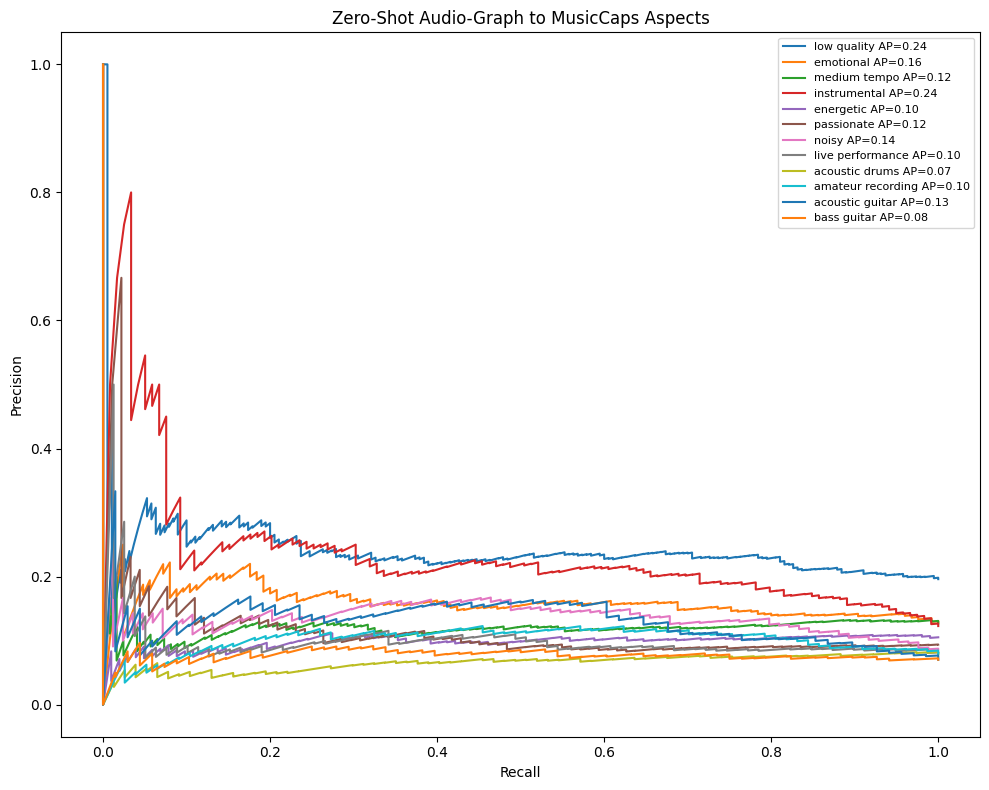

In [61]:
# ============================================================
# CELL 58 - ZERO-SHOT PR CURVES
# ============================================================
freq_order = np.argsort(
    -test_aspect_y.sum(
        axis=0
    )
)[:12]


plt.figure(
    figsize=(10, 8)
)

for k in freq_order:
    precision, recall, _ = (
        precision_recall_curve(
            test_aspect_y[
                :,
                k
            ],
            test_audio_tag_scores[
                :,
                k
            ]
        )
    )

    plt.plot(
        recall,
        precision,
        label=(
            f"{ASPECT_VOCAB[k]} "
            f"AP={audio_tag_ap[k]:.2f}"
        )
    )

plt.xlabel(
    "Recall"
)

plt.ylabel(
    "Precision"
)

plt.title(
    "Zero-Shot Audio-Graph to MusicCaps Aspects"
)

plt.legend(
    fontsize=8
)

plt.tight_layout()

plt.savefig(
    PLOT_DIR
    / "zero_shot_audio_tag_pr.png",
    dpi=180
)

plt.show()

In [62]:
# ============================================================
# CELL 61 - GRAPH COHERENCE
# ============================================================
@torch.no_grad()
def graph_coherence(
    model,
    loader,
    threshold=0.5,
    max_graphs=300
):
    model.eval()

    total = 0
    coherent = 0
    seen = 0

    for batch in loader:
        batch = batch.to(
            DEVICE
        )

        h = (
            model
            .graph_encoder
            .forward_nodes(
                batch
            )
        )

        h = F.normalize(
            h,
            dim=1
        )

        src, dst = (
            batch.edge_index
        )

        cosine = (
            h[src]
            *
            h[dst]
        ).sum(
            dim=1
        )

        coherent += int(
            (
                cosine
                >
                threshold
            ).sum()
        )

        total += int(
            cosine.numel()
        )

        seen += (
            batch.num_graphs
        )

        if (
            seen
            >= max_graphs
        ):
            break

    return (
        coherent
        /
        max(
            total,
            1
        )
    )


coherence = (
    graph_coherence(
        model,
        test_loader
    )
)

print(
    "Graph coherence:",
    round(
        float(
            coherence
        ),
        4
    )
)

with open(
    METRICS_DIR
    / "graph_coherence.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        {
            "graph_coherence": float(
                coherence
            )
        },
        file,
        indent=2,
    )


Graph coherence: 0.616


# Save representative graph samples

The final GitHub folder stores 24 representative PyTorch Geometric graph files.

The complete raw graph cache stays outside the ZIP file.

In [63]:
# CELL 66  Export 24 representative graph examples

for existing_file in SAMPLE_DIR.glob(
    "*.pt"
):
    existing_file.unlink()

sample_frames = []

for split_name, frame in [
    ("training", train_meta),
    ("validation", val_meta),
    ("test", test_meta),
]:
    number_to_select = min(
        8,
        len(frame),
    )

    if number_to_select > 0:
        positions = np.linspace(
            0,
            len(frame) - 1,
            number_to_select,
        ).astype(int)

        selected = (
            frame
            .iloc[
                positions
            ]
            .copy()
        )

        selected[
            "sample_source_split"
        ] = split_name

        sample_frames.append(
            selected
        )

graph_sample_frame = pd.concat(
    sample_frames,
    ignore_index=True,
)

if len(
    graph_sample_frame
) < 24:
    already_selected = set(
        graph_sample_frame[
            "hf_index"
        ].astype(int)
    )

    remaining = (
        paired_meta[
            ~paired_meta[
                "hf_index"
            ].isin(
                already_selected
            )
        ]
        .head(
            24
            - len(
                graph_sample_frame
            )
        )
        .copy()
    )

    remaining[
        "sample_source_split"
    ] = remaining[
        "split"
    ]

    graph_sample_frame = pd.concat(
        [
            graph_sample_frame,
            remaining,
        ],
        ignore_index=True,
    )

manifest_rows = []

for _, row in (
    graph_sample_frame
    .head(24)
    .iterrows()
):
    hf_index = int(
        row["hf_index"]
    )

    source_graph = (
        GRAPH_DIR
        / f"{hf_index:05d}.pt"
    )

    destination_graph = (
        SAMPLE_DIR
        / source_graph.name
    )

    shutil.copy2(
        source_graph,
        destination_graph,
    )

    manifest_rows.append({
        "file": source_graph.name,
        "hf_index": hf_index,
        "split": row[
            "sample_source_split"
        ],
        "pair_id": str(
            row["pair_id"]
        ),
    })

graph_sample_manifest = pd.DataFrame(
    manifest_rows
)

graph_sample_manifest.to_csv(
    SAMPLE_DIR
    / "graph_sample_manifest.csv",
    index=False,
)

number_of_graph_samples = len(
    list(
        SAMPLE_DIR.glob(
            "*.pt"
        )
    )
)

print(
    "Saved graph example files:",
    number_of_graph_samples,
)

assert (
    number_of_graph_samples
    >= 20
), "At least 20 graph samples are required."

Saved graph example files: 24


# Save final metrics and configuration

The final folder stores retrieval results, zero shot results, graph diagnostics, configuration, plots, split manifests, qualitative retrieval examples, the training only scaler, and graph samples.

In [64]:
# CELL 67  Save final metrics and experiment configuration

final_metrics = {
    "caption_to_audio": {
        key: float(value)
        for key, value
        in test_caption_to_audio.items()
    },
    "audio_to_caption": {
        key: float(value)
        for key, value
        in test_audio_to_caption.items()
    },
    "random_chance": {
        key: float(value)
        for key, value
        in random_chance.items()
    },
    "zero_shot_audio_graph_to_aspect": {
        key: float(value)
        for key, value
        in audio_tag_metrics.items()
    },
    "zero_shot_caption_to_aspect": {
        key: float(value)
        for key, value
        in caption_tag_metrics.items()
    },
    "audio_graph_aspect_similarity_threshold": float(
        audio_tag_threshold
    ),
    "caption_aspect_similarity_threshold": float(
        caption_tag_threshold
    ),
    "graph_coherence": float(
        coherence
    ),
    "modality_diagnostics": {
        key: float(value)
        for key, value
        in diagnostic.items()
    },
    "best_epoch": int(
        best_epoch
    ),
    "best_validation_mean_recall_at_10": float(
        best_validation_score
    ),
    "test_size": int(
        len(
            test_meta
        )
    ),
}

with open(
    METRICS_DIR
    / "final_metrics.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        final_metrics,
        file,
        indent=2,
    )

config = {
    "official_metadata_dataset": OFFICIAL_DATASET_ID,
    "audio_dataset": AUDIO_DATASET_ID,
    "split": {
        "training": "is_audioset_eval is False",
        "validation": "is_audioset_eval is True and is_balanced_subset is False",
        "test": "is_balanced_subset is True",
    },
    "sample_rate": SR,
    "clip_seconds": CLIP_SECONDS,
    "segmentation": "Two beat nodes with fixed one second fallback",
    "node_feature_dimension": 100,
    "node_features": (
        "MFCC chroma spectral contrast tonnetz and spectral descriptors using segment mean and standard deviation"
    ),
    "edge_types": [
        "temporal adjacency",
        "cosine similarity",
    ],
    "similarity_threshold": SIM_THRESHOLD,
    "similarity_top_k": SIM_TOP_K,
    "graph_encoder": "Two layer residual GraphSAGE",
    "text_encoder": TEXT_MODEL_NAME,
    "bert_unfreeze_last_transformer_layers": BERT_UNFREEZE_LAST_N,
    "shared_embedding_dimension": EMBED_DIM,
    "loss": "Symmetric InfoNCE",
    "initial_temperature": INITIAL_TEMPERATURE,
    "learnable_temperature": LEARNABLE_TEMPERATURE,
    "batch_size": BATCH_SIZE,
    "maximum_epochs": EPOCHS,
    "early_stopping_patience": PATIENCE,
    "bert_learning_rate": LR_BERT,
    "new_layer_learning_rate": LR_NEW,
    "weight_decay": WEIGHT_DECAY,
    "zero_shot_maximum_aspects": ZERO_SHOT_MAX_TAGS,
    "zero_shot_minimum_training_count": ZERO_SHOT_MIN_TRAIN_COUNT,
    "model_weights_saved": False,
    "large_raw_graph_cache_included_in_zip": False,
    "saved_graph_samples": int(
        number_of_graph_samples
    ),
    "task3_comparison_included": False,
    "human_evaluation_included": False,
    "fast_development_run": FAST_DEV_RUN,
    "seed": SEED,
}

with open(
    CONFIG_DIR
    / "experiment_config.json",
    "w",
    encoding="utf-8",
) as file:
    json.dump(
        config,
        file,
        indent=2,
    )

print(
    json.dumps(
        final_metrics,
        indent=2,
    )
)

{
  "caption_to_audio": {
    "recall_at_1": 0.033023735810113516,
    "recall_at_5": 0.1021671826625387,
    "recall_at_10": 0.16305469556243551,
    "median_rank": 69.0,
    "mean_rank": 137.4984520123839,
    "mean_reciprocal_rank": 0.07844522149219639
  },
  "audio_to_caption": {
    "recall_at_1": 0.023735810113519093,
    "recall_at_5": 0.09494324045407637,
    "recall_at_10": 0.16408668730650156,
    "median_rank": 69.0,
    "mean_rank": 129.422084623323,
    "mean_reciprocal_rank": 0.07219022110963814
  },
  "random_chance": {
    "recall_at_1": 0.0010319917440660474,
    "recall_at_5": 0.005159958720330237,
    "recall_at_10": 0.010319917440660475
  },
  "zero_shot_audio_graph_to_aspect": {
    "macro_f1_score": 0.11659684384298138,
    "micro_f1_score": 0.11803392177223954,
    "macro_area_under_precision_recall_curve": 0.07943612465894165
  },
  "zero_shot_caption_to_aspect": {
    "macro_f1_score": 0.11970012625991462,
    "micro_f1_score": 0.12243568870074895,
    "macro_a

# What to note down for the report

Dataset

MusicCaps metadata with audio available paired clips.

Main architecture

Two layer residual GraphSAGE plus BERT base uncased dual encoder.

Shared embedding

256 dimensional normalized audio and text embeddings.

Training objective

Symmetric InfoNCE contrastive loss.

Main retrieval metrics

Recall at 1.

Recall at 5.

Recall at 10.

Median rank.

Mean reciprocal rank.

Important figures

Graph node distribution.

Similarity edge density.

Contrastive training loss.

Validation Recall at 10.

Test retrieval comparison.

Paired versus random similarity.

Joint embedding t distributed Stochastic Neighbor Embedding.

Zero shot precision recall curves.

# Result interpretation

Compare both retrieval directions.

Compare retrieval performance with random chance.

Use paired versus random cosine similarity to show whether the shared space learned meaningful alignment.

Use the joint embedding visualization to discuss any remaining modality separation.

Report zero shot aspect prediction as a secondary transfer analysis.

In [65]:
# CELL 68  Create README verify folder tree and create download ZIP

readme_text = f"""# Task 4 MusicCaps GNN BERT Contrastive Retrieval

# Goal

Task 4 learns a shared embedding space between MusicCaps audio structure graphs and natural language captions.

The trained system supports caption to audio retrieval and audio to caption retrieval.

# Dataset

Official metadata source: {OFFICIAL_DATASET_ID}

Audio source used by the notebook: {AUDIO_DATASET_ID}

Training pairs after graph validation: {len(train_meta)}

Validation pairs after graph validation: {len(val_meta)}

Test pairs after graph validation: {len(test_meta)}

# Audio Graphs

Sample rate: {SR}

Clip duration: {CLIP_SECONDS} seconds

Main segmentation: groups of {BEATS_PER_NODE} beats

Fallback segmentation: {FALLBACK_SEGMENT_SECONDS} second segments

Node feature dimension: 100

Edges: temporal adjacency plus cosine similarity

Cosine similarity threshold: {SIM_THRESHOLD}

Maximum additional similarity neighbors per node: {SIM_TOP_K}

# Model

Audio encoder: two layer residual GraphSAGE

Text encoder: {TEXT_MODEL_NAME}

Fine tuned BERT transformer layers: final {BERT_UNFREEZE_LAST_N}

Shared embedding dimension: {EMBED_DIM}

Training loss: symmetric InfoNCE

# Main Test Retrieval Result

Caption to Audio Recall at 1: {test_caption_to_audio['recall_at_1']:.4f}

Caption to Audio Recall at 5: {test_caption_to_audio['recall_at_5']:.4f}

Caption to Audio Recall at 10: {test_caption_to_audio['recall_at_10']:.4f}

Audio to Caption Recall at 1: {test_audio_to_caption['recall_at_1']:.4f}

Audio to Caption Recall at 5: {test_audio_to_caption['recall_at_5']:.4f}

Audio to Caption Recall at 10: {test_audio_to_caption['recall_at_10']:.4f}

Best Epoch: {best_epoch}

# Folder Contents

data_splits contains training validation and test pair manifests.

metrics contains training history retrieval results zero shot results graph audits modality diagnostics embedding coordinates and final numerical summaries.

plots contains dataset graph training retrieval similarity embedding and zero shot figures.

retrieval_examples contains ten query captions with their top three retrieved clips.

graph_samples_24 contains 24 representative PyTorch Geometric graph files.

config contains the experiment configuration and zero shot aspect vocabulary.

preprocessing contains the training only graph node StandardScaler.

# Important Notes

The official Google MusicCaps dataset is used for metadata provenance.

Waveform audio comes from the declared audio enabled Hugging Face mirror.

The graph node StandardScaler is fitted using training nodes only.

The zero shot aspect vocabulary is selected using training annotations only.

Large raw graph caches are not included because they can be regenerated and are too large for GitHub.

Model weights are not included.

Task 3 comparison and human evaluation are intentionally not included in this cleaned Task 4 notebook.

The final ZIP file contains the complete GitHub result folder.
"""

with open(
    GITHUB_DIR
    / "README.md",
    "w",
    encoding="utf-8",
) as file:
    file.write(
        readme_text
    )

requirements_text = """torch
torch-geometric
datasets==3.6.0
transformers==4.46.3
librosa==0.10.2.post1
soundfile
joblib
networkx
numpy
pandas
matplotlib
scikit-learn
"""

with open(
    GITHUB_DIR
    / "requirements.txt",
    "w",
    encoding="utf-8",
) as file:
    file.write(
        requirements_text
    )

expected_files = [
    GITHUB_DIR / "README.md",
    GITHUB_DIR / "requirements.txt",
    CONFIG_DIR / "experiment_config.json",
    CONFIG_DIR / "zero_shot_aspect_vocabulary.csv",
    PREPROCESSING_DIR / "training_node_scaler.joblib",
    SPLIT_DIR / "training.csv",
    SPLIT_DIR / "validation.csv",
    SPLIT_DIR / "test.csv",
    METRICS_DIR / "dataset_summary.json",
    METRICS_DIR / "graph_build_failures.csv",
    METRICS_DIR / "graph_audit.csv",
    METRICS_DIR / "bad_graphs.csv",
    METRICS_DIR / "training_history.csv",
    METRICS_DIR / "retrieval_metrics.csv",
    METRICS_DIR / "modality_diagnostics.json",
    METRICS_DIR / "joint_embedding_tsne_coordinates.csv",
    METRICS_DIR / "zero_shot_aspect_metrics.csv",
    METRICS_DIR / "zero_shot_per_aspect_metrics.csv",
    METRICS_DIR / "graph_coherence.json",
    METRICS_DIR / "final_metrics.json",
    PLOT_DIR / "musiccaps_split_counts.png",
    PLOT_DIR / "graph_node_distribution.png",
    PLOT_DIR / "graph_similarity_density.png",
    PLOT_DIR / "contrastive_loss.png",
    PLOT_DIR / "validation_retrieval.png",
    PLOT_DIR / "test_retrieval_metrics.png",
    PLOT_DIR / "paired_vs_nonpaired_similarity.png",
    PLOT_DIR / "joint_embedding_tsne.png",
    PLOT_DIR / "zero_shot_audio_tag_pr.png",
    QUAL_DIR / "caption_to_audio_top3.csv",
    SAMPLE_DIR / "graph_sample_manifest.csv",
]

missing_expected_files = [
    str(path)
    for path in expected_files
    if not path.exists()
]

assert not missing_expected_files, (
    "Expected Task 4 files are missing: "
    + str(
        missing_expected_files
    )
)

saved_graph_files = list(
    SAMPLE_DIR.glob(
        "*.pt"
    )
)

assert (
    len(saved_graph_files)
    >= 20
), "At least 20 graph sample files must exist."

unexpected_weight_files = [
    path
    for path in GITHUB_DIR.rglob(
        "*.pt"
    )
    if path.parent != SAMPLE_DIR
]

assert not unexpected_weight_files, (
    "Unexpected model weight files were found: "
    + str(
        unexpected_weight_files
    )
)

assert str(
    GITHUB_DIR.resolve()
).startswith(
    str(
        KAGGLE_WORKING.resolve()
    )
), "The GitHub folder is not under the Kaggle working directory."

manifest_rows = []

for path in sorted(
    GITHUB_DIR.rglob("*")
):
    if path.is_file():
        manifest_rows.append({
            "relative_path": str(
                path.relative_to(
                    GITHUB_DIR
                )
            ),
            "size_kilobytes": round(
                path.stat().st_size
                / 1024,
                2,
            ),
        })

folder_manifest = pd.DataFrame(
    manifest_rows
)

folder_manifest.to_csv(
    GITHUB_DIR
    / "folder_manifest.csv",
    index=False,
)

print()
print(
    "Verified GitHub folder:"
)

print(
    GITHUB_DIR
)

print()
print(
    "Folder tree"
)

for path in sorted(
    GITHUB_DIR.rglob("*")
):
    relative_path = path.relative_to(
        GITHUB_DIR
    )

    depth = len(
        relative_path.parts
    ) - 1

    prefix = (
        "    " * depth
    )

    if path.is_dir():
        print(
            f"{prefix}{path.name}/"
        )
    else:
        print(
            f"{prefix}{path.name} "
            f"({path.stat().st_size / 1024:.1f} KB)"
        )

zip_base = (
    KAGGLE_WORKING
    / "task4_musiccaps_github_download"
)

zip_file = shutil.make_archive(
    str(
        zip_base
    ),
    "zip",
    root_dir=str(
        KAGGLE_WORKING
    ),
    base_dir=GITHUB_DIR.name,
)

zip_path = Path(
    zip_file
)

assert zip_path.exists()

print()
print(
    "ZIP file created:"
)

print(
    zip_path
)

print(
    "ZIP size in megabytes:",
    round(
        zip_path.stat().st_size
        / (
            1024
            * 1024
        ),
        2,
    ),
)

print()
print(
    "Click the relative link below to download the complete Task 4 folder."
)

print(
    "If the link does not open, save a Kaggle notebook version and download the same ZIP from the Output section."
)

from IPython.display import FileLink, display

previous_directory = os.getcwd()

try:
    os.chdir(
        KAGGLE_WORKING
    )

    display(
        FileLink(
            "task4_musiccaps_github_download.zip"
        )
    )

finally:
    os.chdir(
        previous_directory
    )


Verified GitHub folder:
/kaggle/working/task4_musiccaps_github

Folder tree
README.md (2.5 KB)
config/
    experiment_config.json (1.4 KB)
    zero_shot_aspect_vocabulary.csv (0.6 KB)
data_splits/
    test.csv (326.8 KB)
    training.csv (778.2 KB)
    validation.csv (574.5 KB)
folder_manifest.csv (2.0 KB)
graph_samples_24/
    00000.pt (8.2 KB)
    00001.pt (8.6 KB)
    00064.pt (9.7 KB)
    00551.pt (6.4 KB)
    00710.pt (9.4 KB)
    01208.pt (10.7 KB)
    01426.pt (8.7 KB)
    01503.pt (9.1 KB)
    02009.pt (9.4 KB)
    02065.pt (10.7 KB)
    02274.pt (8.7 KB)
    02651.pt (11.0 KB)
    03095.pt (9.7 KB)
    03226.pt (8.2 KB)
    03254.pt (9.4 KB)
    03859.pt (9.4 KB)
    03980.pt (9.8 KB)
    04069.pt (7.6 KB)
    04596.pt (12.3 KB)
    04640.pt (8.2 KB)
    05007.pt (8.7 KB)
    05292.pt (11.1 KB)
    05348.pt (11.0 KB)
    05351.pt (9.2 KB)
    graph_sample_manifest.csv (0.9 KB)
metrics/
    bad_graphs.csv (0.0 KB)
    dataset_summary.json (0.1 KB)
    final_metrics.json (1.5 K

/kaggle/working/task4_musiccaps_github_download.zip

# Download result

After the full run, download:

task4_musiccaps_github_download.zip

The final code cell proves that the folder exists under `/kaggle/working/`, checks all important result files, confirms at least 20 graph samples, confirms that no model weight files were saved, prints the folder tree, creates the ZIP file, and uses a relative Kaggle download link.

If the clickable link still fails, use Save Version and download the same ZIP from the Kaggle Output section.